# Analysis of PhD application

### Abstract

In this Jupyter notebook, I analyze a dataset containing information about PhD applicants to major universities. I use machine learning methods to predict if the university admissions committee accepts, waitlists or rejects the application. The main goal of this project is to predict rating score assigned to the student by the committee. 

### Table of Contents

1. Import Libraries
2. Introduction
   - Data Set
   - Variable Description
3. Data Analysis 
    - Data Visualization
    - Using groupby
4. Data Prepocessing
    1. Handling Missing Values
    2. Target variable
    3. Converting categorical variables to numeric variables 
5. Overview of the Methods.
    1. Gradient Descent
        a. Batch Gradient Descent
        b. Stochastic Gradient Descent
        c. Mini-Batch Gradient Descent
    2. Neural Networks
        a. Bulding Blocks: Neurons
        b. A Simple Example
        c. Combining Neurons into Neural Network
        d. Feedforward
        e. Training a Neural Network

6. Applying Machine Learning to predict DECISION using RATING
    1. Decision Tree
    2. Logistic Regression
    3. Random Forest
    4. Stochastic Gradient Descent
    5. KNN
    6. Gaussian Naive Bayes
    7. Perceptron
    8. SVM
    9. Linear SVM
    10. Adaptive Boosting
    11. XGBoost
    12. Which Model is the best ? Table 1  

8. Models with the grid search(to predict Decision)
    1. Decision Tree (DT)
    2. Logistic Regression (LG)
    3. Random Forest (RF)
    4. Stochastic Gradient Descent (SGD)
    5. KNN
    6. Gaussian Naive Bayes (GNB)
    7. Perceptron
    8. SVM
    9. Linear SVM
    10. Adaptive Boosting
    11. XGBoost
    12. Cat Boost
    13. Light GBM
    14. Which Model is the best ? Table 4 
    15. Stacking Approach
    16. Using h2o AutoML 
8. Estimating the Rating Variable packages
    1. Individual Models
    1. h2o AutoML
    2. h2o GBM 
    3. h2o RF
    4. h2o RF
    2. Deep Learning Estimator
    3. Deep Water Estimator
10. References



In [1]:
# Import Libraries

In [2]:
#Here, we are importing all the necessary libraries.

In [3]:
import pandas as pd
import numpy as np
import xgboost as xgb
import lightgbm as lgb
import seaborn as sns

import matplotlib.pyplot as plt
import scipy.stats as stats




# For data visualization
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import style
from IPython.display import Image



# All the models we will apply
from sklearn import linear_model


from sklearn.model_selection import train_test_split


from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform



from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix


#from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score

from scipy.stats import skew  # for some statistics
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

from sklearn import tree

from sklearn import model_selection

from mlxtend.classifier import StackingCVClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from xgboost.sklearn import XGBClassifier

from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.linear_model import TheilSenRegressor
from sklearn.linear_model import RANSACRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNetCV, LassoCV, RidgeCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.kernel_ridge import KernelRidge






import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
warnings.filterwarnings(action="ignore", message="^internal gelsd")
warnings.filterwarnings(action='ignore',category=DeprecationWarning)
warnings.filterwarnings(action='ignore',category=FutureWarning)

/Users/sergazy/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [4]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "MStat"

def save_fig(fig_id, tight_layout=True):
    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)

# Introduction


The data used for this analysis was collected from a major Universities Graduate Mathematics Application system for students applying for the Mathematics PHD program. The information is used by the department of mathematics to determine which applicants will be admitted into the graduate program. Each year members of the department of mathematics review each graduate application and give the prospective student a rating score between one and five, five being the best, with all values in between possible. This rating score determines whether an applicant is accepted, rejected, or put on a waitlist for the Universities Mathematics graduate program. 

The rating score (or just RATING) and whether an applicant is accepted, rejected, or put on a waitlist (DECISION) are the variables of interest for this project. The purpose of this research is to create both a regression and classification models that can accurately predict the RATING and DECISION, based on the data submitted by the student. The models we use includes Random Forest, Gradient Boosting, Generalized Linear Models, Stacked Ensemble, XGBoost and Deep Learning. 



## Data Set

The data is collected in a spreadsheet for easy visual inspection. Each row of data represents a single applicant identified by a unique identification number. Each application consists of the qualitative and quantitative data described in the table below. Note that the qualitative variables are identified by blue highlighting.The following variables make up the columns of the spreadsheet. Note that some of these fields are optional for the student to submit, so not every field has an entry for every student. This creates an issues of missing data, and later on we will discuss how this issue was dealt with.

In [5]:
from IPython.display import HTML, display
import tabulate

table = [["Applicant Client ID","Application ID"],
         ["Emphasis Area",'First choice of study area'],
         ["Emphasis Area 2",'Secondary choice of study area'],
         ["Emphasis Area 3",'Tertiary choice of study area'], 
         ["UU_APPL_CITIZEN","US Citizen (Yes or No)"],
         ["AGE",'Age of the applicant in years'],
         ["SEX",'Gender of the applicant: Male or Female'], 
         ["LOW_INCOME",'If the applicant is coming from low income family'],
         ["UU_FIRSTGEN",'If the appicant is the first generation attending grad school'],
         ["UU_APPL_NTV_LANG","Applicant's native language"], 
         ["HAS_LANGUAGE_TEST",'Foreign Language Exam, if applicable (TOEFL IBT, IELTS, or blank)'],
         ["TEST_READ",'Score on the reading part of TOEFL'],
         ["TEST_SPEAK",'Score on the speaking part of TOEFL'], 
         ["TEST_WRITE",'Score on the writing part of TOEFL'],
         ["TEST_LISTEN",'Score on the listening part of TOEFL'],
         ["MAJOR",'Applicants undergraduate major'], 
         ["GPA",'Applicants GPA'],
         ["NUM_PREV_INSTS",'Number of the previous institutions student studied'],
         ["HAS_GRE_GEN",'If applicant has taken GRE General exam'], 
         ["GRE_VERB",'Raw score on verbal part of the GRE'],
         ["GRE_QUANT",'Raw score on the quantitative part of the GRE'],
         ["GRE_AW",'Raw score on analytical writing part of the GRE'], 
         ["HAS_GRE_SUBJECT",'If applicant has taken GRE Subject exam'],
         ["GRE_SUB",'Raw score on Math subject GRE'],
         ["NUM_RECOMMENDS",'Number of recommenders of the applicant'],
         ["R_AVG_ORAL","Average rating of recommenders' for applicant's oral excellence" ], 
         ["R_AVG_WRITTEN","Average rating of recommenders' for applicant's written excellence"],
         ["R_AVG_ACADEMIC","Average of recommender's for applicants academic excellence"], 
         ["R_AVG_KNOWLEDGE","Average rating of recommenders' for applicant's knowledge of field excellence"],
         ["R_AVG_EMOT","Average rating of recommenders' for applicant's emotional excellence"],
         ["R_AVG_MOT","Average rating of recommenders' for applicant's motivation excellence"], 
         ["R_AVG_RES","Average rating of recommenders' for applicant's research skill excellence"],
         ["R_AVG_RATING","Average rating of recommenders' for applicant's overall rating"],
         ["RATING",'Rating score (any value between 1-5)'], 
         ["DECISION",'Faculty application decision (Accept, Reject, or Waitlist)'], ]
headers = ["Variable", "Description"]
print(display(HTML(tabulate.tabulate(table, headers,tablefmt='html'))))

Variable,Description
Applicant Client ID,Application ID
Emphasis Area,First choice of study area
Emphasis Area 2,Secondary choice of study area
Emphasis Area 3,Tertiary choice of study area
UU_APPL_CITIZEN,US Citizen (Yes or No)
AGE,Age of the applicant in years
SEX,Gender of the applicant: Male or Female
LOW_INCOME,If the applicant is coming from low income family
UU_FIRSTGEN,If the appicant is the first generation attending grad school
UU_APPL_NTV_LANG,Applicant's native language


None


<h2 style='padding: 1px'>Table 1.1.</h2><table class='table table-striped'> <thead> <tr> <th>#</th> <th>Variable</th> <th>Description</th> <th>Type</th> </tr> </thead> <tbody> <tr> 
    <th scope='row'>1</th> <td>Applicant Client ID</td> <td>Application ID</td> <td>Numeric</td> </tr> <tr> 
    <th scope='row'>2</th> <td>Emphasis Area</td> <td>First choice of study area</td> <td>Factor</td> </tr> <tr> 
    <th scope='row'>3</th> <td>Emphasis Area 2</td> <td>Secondary choice of study area</td> <td>Factor</td> </tr> <tr> 
    <th scope='row'>4</th> <td>Emphasis Area 3</td> <td>Tertiary choice of study area</td> <td>Factor</td> </tr> <tr> 
    <th scope='row'>5</th> <td>UU_APPL_CITIZEN</td> <td>US Citizen (Yes or No)</td> <td>Factor(Binary)</td> </tr><tr> 
    <th scope='row'>6</th> <td>CTZNSHP</td> <td>Citizenship of the Applicant</td> <td>Factor(Binary)</td> </tr><tr>
    <th scope='row'>7</th> <td>AGE</td> <td>Age of the applicant in years</td> <td>Numeric</td> </tr> <tr> 
    <th scope='row'>8</th> <td>SEX</td> <td>Gender of the applicant</td> <td>Factor</td> </tr> <tr> 
    <th scope='row'>9</th> <td>LOW_INCOME</td> <td>If the applicant is coming from low income family</td> <td>Factor(Binary)</td> </tr> <tr>  
    <th scope='row'>10</th> <td>UU_FIRSTGEN</td> <td>If the appicant is the first generation attending grad school</td> <td>Factor(Binary)</td> </tr><tr>   
    <th scope='row'>11</th> <td>UU_APPL_NTV_LANG</td> <td>Applicant's native language</td> <td>Factor</td></tr><tr>
    <th scope='row'>12</th> <td>HAS_LANGUAGE_TEST</td> <td>Foreign Language Exam, if applicable(TOEFL IBT, IELTS, or blank)</td> <td>Factor</td> </tr><tr> 
    <th scope='row'>13</th> <td>TEST_READ</td> <td>Score on the reading part of TOEFL</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>14</th> <td>TEST_SPEAK</td> <td>Score on the speaking part of TOEFL</td> <td>Numeric</td> </tr><tr>
    <th scope='row'>15</th> <td>TEST_WRITE</td> <td>Score on the writing part of TOEFL</td> <td>Numeric</td> </tr><tr>
    <th scope='row'>16</th> <td>TEST_LISTEN</td> <td>Score on the listening part of TOEFL</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>17</th> <td>MAJOR</td> <td>Applicant's undergraduate major</td> <td>Factor</td> </tr><tr> 
    <th scope='row'>18</th> <td>GPA</td> <td>Applicant's GPA </td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>19</th> <td>NUM_PREV_INSTS</td> <td>Number of the previous institutions student studied</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>20</th> <td>HAS_GRE_GEN</td> <td>If applicant has taken GRE General exam</td> <td>Factor(Binary)</td> </tr><tr> 
    <th scope='row'>21</th> <td>GRE_VERB</td> <td>Raw score on verbal part of the GRE</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>22</th> <td>GRE_QUANT</td> <td>Raw score on quantitative part of the GRE</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>23</th> <td>GRE_AW</td> <td>Raw score on analytical writing part of the GRE</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>24</th> <td>HAS_GRE_SUBJECT</td> <td>If applicant has taken GRE Subject exam</td> <td>Factor(Binary)</td> </tr><tr> 
    <th scope='row'>25</th> <td>GRE_SUB</td> <td>Raw score on Math subject GRE</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>26</th> <td>NUM_RECOMMENDS</td> <td>Number of recommenders of the applicant</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>27</th> <td>R_AVG_ORAL</td> <td>Average rating of recommenders' for applicant's oral excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>28</th> <td>R_AVG_WRITTEN</td> <td>Average rating of recommenders' for applicant's written excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>29</th> <td>R_AVG_ACADEMIC</td> <td>Average rating of recommenders' for applicant's academic excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>30</th> <td>R_AVG_KNOWLEDGE</td> <td>Average rating of recommenders' for applicant's knowledge of field excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>31</th> <td>R_AVG_EMOT</td> <td>Average rating of recommenders' for applicant's emotional excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>32</th> <td>R_AVG_MOT</td> <td>Average rating of recommenders' for applicant's motivational excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>33</th> <td>R_AVG_RES</td> <td>Average rating of recommenders' for applicant's research of skill excellence</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>34</th> <td>R_AVG_RATING</td> <td>Average rating of recommenders' for applicant's overall rating</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>35</th> <td>RATING</td> <td>Rating score of the committee</td> <td>Numeric</td> </tr><tr> 
    <th scope='row'>36</th> <td>DECISION</td> <td>Faculty application decision (Accept, Reject, or Waitlist)</td> <td>Factor</td> </tr><tr> 
    </tr><tr> </tbody> </table>

The data set includes 759 graduate applications, that were submitted for admission in Fall 2016, Fall 2017, Fall 2018 and Fall 2019. There are various missing data points throughout both the dataset. The figure 1.1. below describes the number of missing values for each variable for whole data set. Missing data is represented by shorter columns. The bottom of the table lists the various variable names. The top of the table represents how many data entries we have. On the left of the table is the percentage of the missing data for a specific category.  The numbers on the right of the table records the number of variables that each variable has. For example, on the bottom columns starting from TEST_READ, TEST_SPEAK, TEST_WRITE and TEST_LISTEN have shorter columns.

#### Figure 1.1.

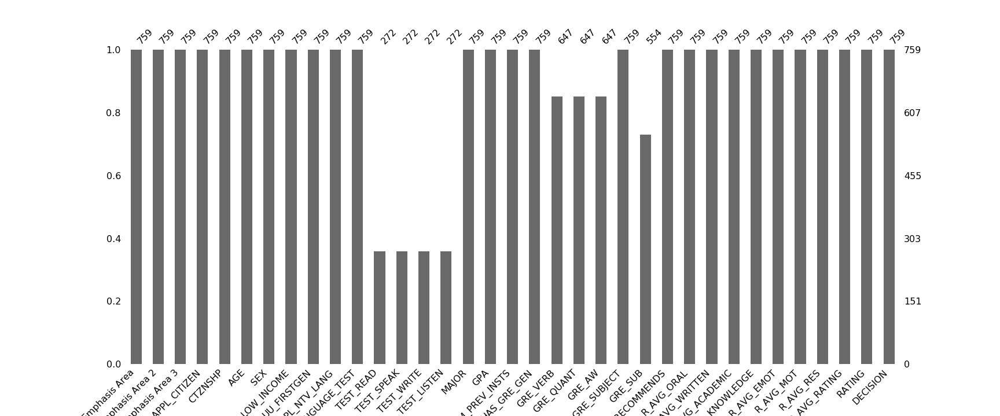

In [6]:
from IPython.display import Image
img_url = 'missing_data.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

The applicants age (AGE) was calculated using the applicants birthday and is accurate as of 1 January of the year in which they applied. Also, since all universities do not use the same GPA scale, GPA values over four were reviewed and scaled based on information deduced from the applicants resume. 

# Data Analysis

To be able to do some analysis. We will need to load the data into the jyputer notebook. We can see the head of the data. The output is hided because of confidentiality reasons.

In [7]:
students =  pd.read_csv('Sergazy_last.csv')
#students.head(4)

After loading the data into jupyter notebook, we can see the name of the variables, the number of non missing observations each variable has and the type of the variable. 

In [8]:
students.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 759 entries, 0 to 758
Data columns (total 36 columns):
Applicant_Client_ID    759 non-null int64
Emphasis Area          759 non-null object
Emphasis Area 2        759 non-null object
Emphasis Area 3        759 non-null object
UU_APPL_CITIZEN        759 non-null object
CTZNSHP                759 non-null object
AGE                    759 non-null float64
SEX                    759 non-null object
LOW_INCOME             759 non-null object
UU_FIRSTGEN            759 non-null object
UU_APPL_NTV_LANG       759 non-null object
HAS_LANGUAGE_TEST      759 non-null object
TEST_READ              272 non-null float64
TEST_SPEAK             272 non-null float64
TEST_WRITE             272 non-null float64
TEST_LISTEN            272 non-null float64
MAJOR                  759 non-null object
GPA                    759 non-null float64
NUM_PREV_INSTS         759 non-null int64
HAS_GRE_GEN            759 non-null object
GRE_VERB               647 non-

As we mentioned in Table 1.1. there are 36 columns with  759 number of observations. Let us see the number of the missing values for each variable.

In [9]:
students.isnull().sum()

Applicant_Client_ID      0
Emphasis Area            0
Emphasis Area 2          0
Emphasis Area 3          0
UU_APPL_CITIZEN          0
CTZNSHP                  0
AGE                      0
SEX                      0
LOW_INCOME               0
UU_FIRSTGEN              0
UU_APPL_NTV_LANG         0
HAS_LANGUAGE_TEST        0
TEST_READ              487
TEST_SPEAK             487
TEST_WRITE             487
TEST_LISTEN            487
MAJOR                    0
GPA                      0
NUM_PREV_INSTS           0
HAS_GRE_GEN              0
GRE_VERB               112
GRE_QUANT              112
GRE_AW                 112
HAS_GRE_SUBJECT          0
GRE_SUB                205
NUM_RECOMMENDS           0
R_AVG_ORAL               0
R_AVG_WRITTEN            0
R_AVG_ACADEMIC           0
R_AVG_KNOWLEDGE          0
R_AVG_EMOT               0
R_AVG_MOT                0
R_AVG_RES                0
R_AVG_RATING             0
RATING                   0
DECISION                 0
dtype: int64

## Data Visualization

We would like to see the relations between variables via visualization. Let us start by counting number of students who admitted, rejected and waitlisted.

In [10]:
# to make this notebook's output identical at every run
np.random.seed(42)

In [11]:
students['DECISION'].value_counts()

Reject      403
Waitlist    242
Admit       114
Name: DECISION, dtype: int64

Histogram of the all students look like

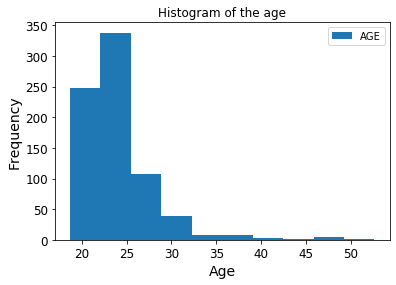

In [12]:
students['AGE'].plot(kind = 'hist', legend= True, title = 'Histogram of the age')
plt.xlabel('Age')
#plt.ylabel('ylabel')
plt.show()
#ax.set_xlabel("Age")
#ax.set_ylabel("y label")

In [13]:
#students.plot(kind = 'scatter',x = 'GPA',y = 'RATING')

WE would like to show the relations between their GPA, recommendor's average rating and the committee rating. 

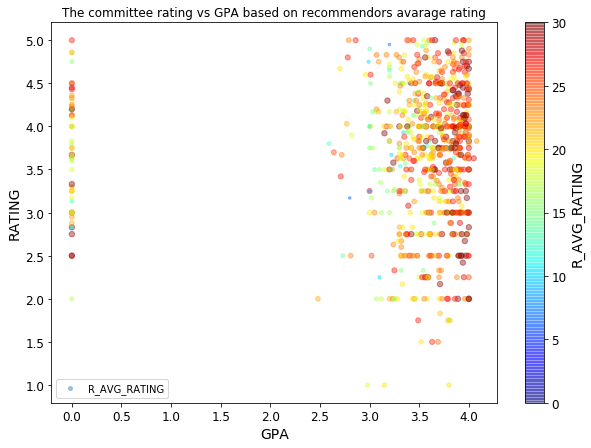

In [14]:
students.plot(kind="scatter", x="GPA", y="RATING", alpha=0.4,
    s=students["R_AVG_RATING"], label="R_AVG_RATING", figsize=(10,7),
    c="R_AVG_RATING", cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False, title = 'The committee rating vs GPA based on recommendors average rating')
plt.legend()
plt.show()
#save_fig("students_rating_GPA_scatterplot")

The next figure shows the relationship between decision variable according to the gender (sex variable).

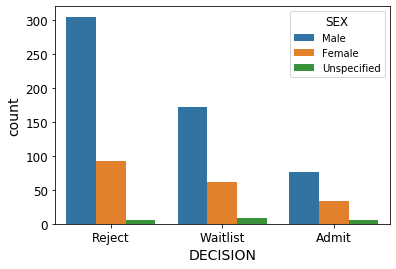

In [15]:
sns.countplot(data = students, x = 'DECISION', hue = 'SEX')
plt.show()

In [16]:
#sns.countplot(data = students, x = 'DECISION', hue = 'MAJOR')

In the following figure, we will see the relationship between decision, major and sex.

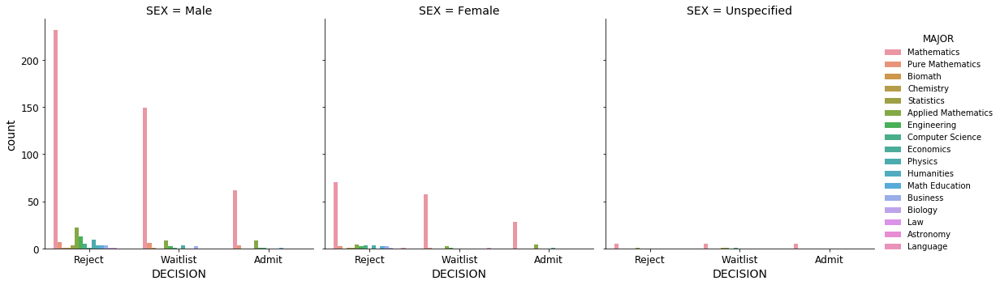

In [17]:
sns.catplot(data = students, x = 'DECISION', hue = 'MAJOR', kind = 'count', col = 'SEX')
plt.show()

This histogram does not tell you much except that unspecified sex has equal number of being accepted,rejected, or waitlisted. 

Let us see the scatter plot of decision variable according to AGE and GPA variables. This scatter plot shows that there are 9-10 students over the age of 40 and 2 of them are admitted. 

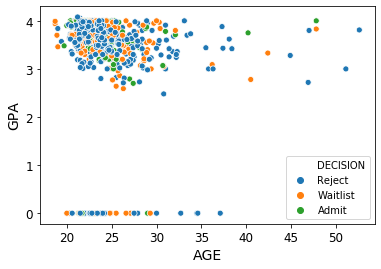

In [18]:
sns.scatterplot(x = 'AGE',y = 'GPA', data =students,hue = 'DECISION')
plt.show()

We wonder if the average rating of recommenders' for applicant's overall rating has any relation between decision variable. We see that there is no implication that higher overall rating implies higher chance of admitted.

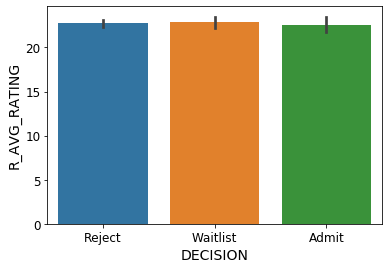

In [19]:
sns.barplot(y = 'R_AVG_RATING',x = 'DECISION', data = students)
plt.show()

Next plot shows the relationship between low income and decision. The distribution of the each category(Admit, Reject,or Waitlist) looks very similar based on income of the family of the applicant.

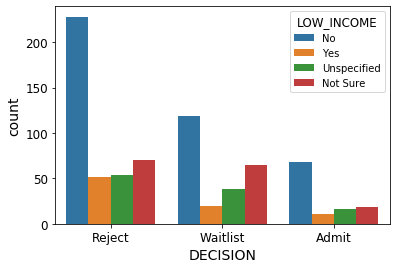

In [20]:
sns.countplot(data = students, x = 'DECISION', hue = 'LOW_INCOME')
plt.show()
#UU_FIRSTGEN            
#UU_APPL_NTV_LANG 

Similarly, let us the if there is a strong relation between first generation who attends to graduate school and decision.

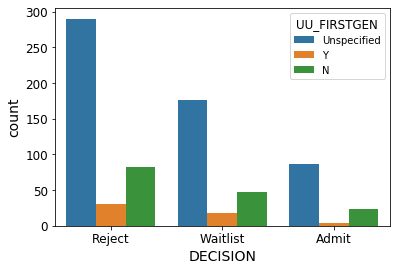

In [21]:
sns.countplot(data = students, x = 'DECISION', hue = 'UU_FIRSTGEN')
plt.show()

Let us the if there is a strong relation between number of previous students and decision.

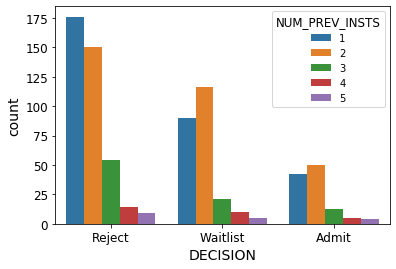

In [22]:
sns.countplot(data = students, x = 'DECISION', hue = 'NUM_PREV_INSTS')
plt.show()

These histograms show that low income, being first generation in your family coming to grad school or number of previous institutions you studied are relavent to being accepted. 

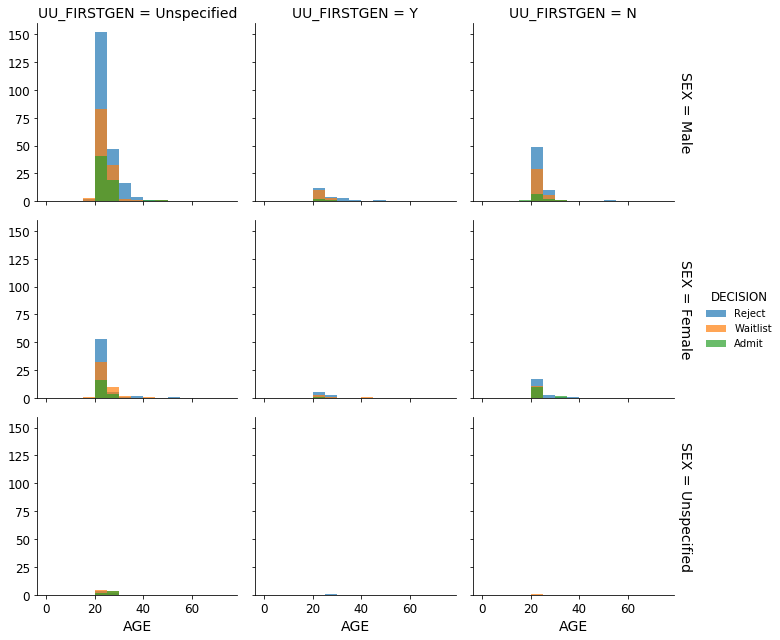

In [23]:
bins = np.arange(0, 80, 5)
g = sns.FacetGrid(students, row='SEX', col='UU_FIRSTGEN', hue='DECISION', margin_titles=True, height=3, aspect=1.1)
g.map(sns.distplot, 'AGE', kde=False, bins=bins, hist_kws=dict(alpha=0.7))
g.add_legend()  
plt.show()  

In [24]:
#Here, We do not any see any blue color in left bottom corner.  
#We see that unspecified first generation and unspecified sex helped to increase the chance of getting admitted. 

In the next plot, we will see the relation between GPA and decision. From the plot we see that waitlisted people have higher average than GPA of admitted people.

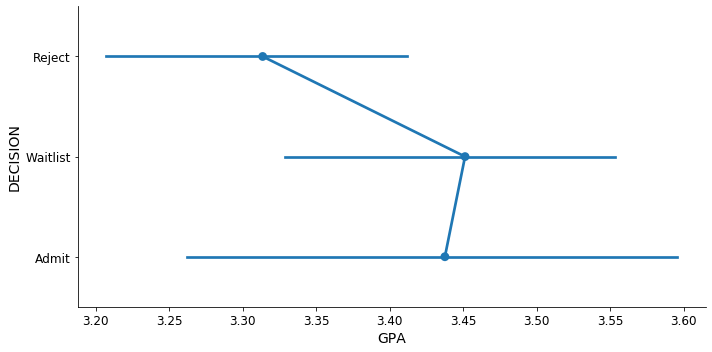

In [25]:
sns.catplot('GPA','DECISION',data = students, aspect = 2.0, kind = 'point' )
plt.show()

In the following plot, we see that admitted students tend to have higher number of previous institutions.

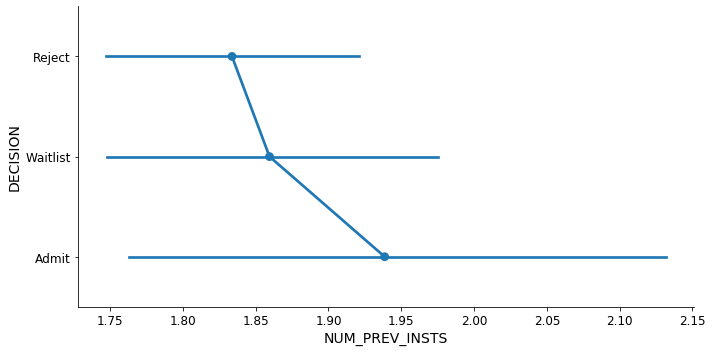

In [26]:
sns.catplot('NUM_PREV_INSTS','DECISION',data = students, aspect = 2.0, kind = 'point' )
plt.show()

### Using groupby to see the relations

First we drop applicant's client ID. The next table shows the mean of the numerical variables according to their gender. 

In [27]:
students = students.drop('Applicant_Client_ID',axis =1)
print(type(students.groupby('SEX').mean()))
students.groupby('SEX').mean()

<class 'pandas.core.frame.DataFrame'>


,AGE,TEST_READ,TEST_SPEAK,TEST_WRITE,TEST_LISTEN,GPA,NUM_PREV_INSTS,GRE_VERB,GRE_QUANT,GRE_AW,...,NUM_RECOMMENDS,R_AVG_ORAL,R_AVG_WRITTEN,R_AVG_ACADEMIC,R_AVG_KNOWLEDGE,R_AVG_EMOT,R_AVG_MOT,R_AVG_RES,R_AVG_RATING,RATING
SEX,,,,,,,,,,,,,,,,,,,,,
Female,23.865241,26.148936,22.308511,23.744681,25.680851,3.493529,1.877005,155.368750,163.937500,3.868750,...,3.197861,14.771658,14.660428,16.567914,16.156150,16.290374,17.993048,14.368984,22.209091,3.754545
Male,24.333816,27.418981,21.875000,24.476852,26.037037,3.328879,1.853526,156.038217,166.065817,3.757962,...,3.160940,14.212477,14.263291,16.847920,16.963834,15.775769,17.888969,14.633635,22.992043,3.649747
Unspecified,24.073684,27.333333,20.166667,24.222222,22.666667,3.595789,1.789474,153.187500,166.437500,3.468750,...,3.421053,12.584211,12.963158,16.300000,15.752632,15.005263,16.542105,13.442105,20.826316,4.089474


In [28]:
#students.groupby('SEX').sum().plot(kind='bar');
#students.groupby(['SEX', 'DECISION'] )['DECISION'].count().plot.bar(figsize=(8, 6));

Let us group the students according to their decision and their gender. 

In [29]:
students.groupby(['SEX', 'DECISION'] )['DECISION'].count().unstack('SEX')

SEX,Female,Male,Unspecified
DECISION,,,
Admit,33,76,5
Reject,92,305,6
Waitlist,62,172,8


Let us group the students according to their decision, gender, first generation and their gender. 

In [30]:
students.groupby(['SEX', 'DECISION','UU_FIRSTGEN'] )['DECISION'].count().unstack('SEX')

SEX                   Female   Male  Unspecified
DECISION UU_FIRSTGEN                            
Admit    N              12.0   11.0          NaN
         Unspecified    20.0   62.0          5.0
         Y               1.0    3.0          NaN
Reject   N              22.0   61.0          NaN
         Unspecified    62.0  223.0          5.0
         Y               8.0   21.0          1.0
Waitlist N              11.0   36.0          1.0
         Unspecified    46.0  123.0          7.0
         Y               5.0   13.0          NaN

In [31]:
#students.groupby(['SEX', 'DECISION','UU_FIRSTGEN'] )['DECISION'].count().unstack(1).plot.bar(figsize=(8, 6));

# Data Prepocessing

## Handling Missing values

The following table shows how many missing values each variable has.

In [32]:
students.isnull().sum()

Emphasis Area          0
Emphasis Area 2        0
Emphasis Area 3        0
UU_APPL_CITIZEN        0
CTZNSHP                0
AGE                    0
SEX                    0
LOW_INCOME             0
UU_FIRSTGEN            0
UU_APPL_NTV_LANG       0
HAS_LANGUAGE_TEST      0
TEST_READ            487
TEST_SPEAK           487
TEST_WRITE           487
TEST_LISTEN          487
MAJOR                  0
GPA                    0
NUM_PREV_INSTS         0
HAS_GRE_GEN            0
GRE_VERB             112
GRE_QUANT            112
GRE_AW               112
HAS_GRE_SUBJECT        0
GRE_SUB              205
NUM_RECOMMENDS         0
R_AVG_ORAL             0
R_AVG_WRITTEN          0
R_AVG_ACADEMIC         0
R_AVG_KNOWLEDGE        0
R_AVG_EMOT             0
R_AVG_MOT              0
R_AVG_RES              0
R_AVG_RATING           0
RATING                 0
DECISION               0
dtype: int64

In [33]:
# import missingno as msno
# fig = plt.figure()
# msno.bar(students)
# fig.savefig('missing_data.png')

By looking the table, either we can get rid off 8 variables that have missing values or we can fill them mean, median or common values. We will go with the latter method. In other words we will apply simple imputation method.

In [34]:
#students = students.drop('Applicant_Client_ID',axis =1)

Before imputation, first, let us take a look of GPA. We know GPA should not be higher than 4. Let us see if there is GPA higher than 4.

In [35]:
students['GPA'].nlargest(6)

733    4.08
105    4.05
34     4.00
36     4.00
69     4.00
114    4.00
Name: GPA, dtype: float64

This shows we have two student entered their GPA higher than 4. We will set them to 4.00 to be consistent.

In [36]:
students.loc[733,'GPA'] = 4.00
students.loc[105,'GPA'] = 4.00

In [37]:
#students.columns

We would like to impute all the missing variables. A lot of the applicants are from English speaking countries like US, UK and Canada. That is why, their TOEFL scores are missing.  According to this website, https://www.prepscholar.com/toefl/blog/what-is-the-average-toefl-score/
United States's average TOEFL score is for Reading 21,  for Speaking 23,  for Writing 22 and for Listening 23. Total of these scores is 89. This is also very similar to UK and Canada. Before imputing the missing variables with this average of the countries given on this website,  we will see first average scores other students TOEFL score for each section based on their gender. 

In [38]:
# with pd.option_context('display.max_rows', None, 'display.max_columns', None):
#       print(students.head())

In [39]:
students.groupby('SEX').mean()

,AGE,TEST_READ,TEST_SPEAK,TEST_WRITE,TEST_LISTEN,GPA,NUM_PREV_INSTS,GRE_VERB,GRE_QUANT,GRE_AW,...,NUM_RECOMMENDS,R_AVG_ORAL,R_AVG_WRITTEN,R_AVG_ACADEMIC,R_AVG_KNOWLEDGE,R_AVG_EMOT,R_AVG_MOT,R_AVG_RES,R_AVG_RATING,RATING
SEX,,,,,,,,,,,,,,,,,,,,,
Female,23.865241,26.148936,22.308511,23.744681,25.680851,3.493102,1.877005,155.368750,163.937500,3.868750,...,3.197861,14.771658,14.660428,16.567914,16.156150,16.290374,17.993048,14.368984,22.209091,3.754545
Male,24.333816,27.418981,21.875000,24.476852,26.037037,3.328788,1.853526,156.038217,166.065817,3.757962,...,3.160940,14.212477,14.263291,16.847920,16.963834,15.775769,17.888969,14.633635,22.992043,3.649747
Unspecified,24.073684,27.333333,20.166667,24.222222,22.666667,3.595789,1.789474,153.187500,166.437500,3.468750,...,3.421053,12.584211,12.963158,16.300000,15.752632,15.005263,16.542105,13.442105,20.826316,4.089474


## Imputing the missing Values

We will replaces the missing values of any variables with the mean of other observations for particular variable accoring to their gender.

In [40]:
g_mean = students.groupby('SEX').mean()
#df.loc[df.Age.isnull() & (df.Sex == 'female'),'Age'] = g_mean['Age']['female']
#df.loc[df.Age.isnull() & (df.Sex == 'male'), 'Age'] = g_mean['Age']['male']

# Fill the TEST_READ
students.loc[students.TEST_READ.isnull() & (students.SEX == 'Male'),'TEST_READ'] = g_mean['TEST_READ']['Male'] 
students.loc[students.TEST_READ.isnull() & (students.SEX == 'Female'),'TEST_READ'] = g_mean['TEST_READ']['Female']
students.loc[students.TEST_READ.isnull() & (students.SEX == 'Unspecified'),'TEST_READ'] = g_mean['TEST_READ']['Unspecified']

# Fill the TEST_SPEAK
students.loc[students.TEST_SPEAK.isnull() & (students.SEX == 'Male'),'TEST_SPEAK'] = g_mean['TEST_SPEAK']['Male'] 
students.loc[students.TEST_SPEAK.isnull() & (students.SEX == 'Female'),'TEST_SPEAK'] = g_mean['TEST_SPEAK']['Female']
students.loc[students.TEST_SPEAK.isnull() & (students.SEX == 'Unspecified'),'TEST_SPEAK'] = g_mean['TEST_SPEAK']['Unspecified']

# Fill the TEST_LISTEN
students.loc[students.TEST_LISTEN.isnull() & (students.SEX == 'Male'),'TEST_LISTEN'] = g_mean['TEST_LISTEN']['Male'] 
students.loc[students.TEST_LISTEN.isnull() & (students.SEX == 'Female'),'TEST_LISTEN'] = g_mean['TEST_LISTEN']['Female']
students.loc[students.TEST_LISTEN.isnull() & (students.SEX == 'Unspecified'),'TEST_LISTEN'] = g_mean['TEST_LISTEN']['Unspecified']

# Fill the TEST_WRITE
students.loc[students.TEST_WRITE.isnull() & (students.SEX == 'Male'),'TEST_WRITE'] = g_mean['TEST_WRITE']['Male'] 
students.loc[students.TEST_WRITE.isnull() & (students.SEX == 'Female'),'TEST_WRITE'] = g_mean['TEST_WRITE']['Female']
students.loc[students.TEST_WRITE.isnull() & (students.SEX == 'Unspecified'),'TEST_WRITE'] = g_mean['TEST_WRITE']['Unspecified']

# Fill the GRE_VERB
students.loc[students.GRE_VERB.isnull() & (students.SEX == 'Male'),'GRE_VERB'] = g_mean['GRE_VERB']['Male'] 
students.loc[students.GRE_VERB.isnull() & (students.SEX == 'Female'),'GRE_VERB'] = g_mean['GRE_VERB']['Female']
students.loc[students.GRE_VERB.isnull() & (students.SEX == 'Unspecified'),'GRE_VERB'] = g_mean['GRE_VERB']['Unspecified']

# Fill the GRE_QUANT
students.loc[students.GRE_QUANT.isnull() & (students.SEX == 'Male'),'GRE_QUANT'] = g_mean['GRE_QUANT']['Male'] 
students.loc[students.GRE_QUANT.isnull() & (students.SEX == 'Female'),'GRE_QUANT'] = g_mean['GRE_QUANT']['Female']
students.loc[students.GRE_QUANT.isnull() & (students.SEX == 'Unspecified'),'GRE_QUANT'] = g_mean['GRE_QUANT']['Unspecified']

# Fill the GRE_AW
students.loc[students.GRE_AW.isnull() & (students.SEX == 'Male'),'GRE_AW'] = g_mean['GRE_AW']['Male'] 
students.loc[students.GRE_AW.isnull() & (students.SEX == 'Female'),'GRE_AW'] = g_mean['GRE_AW']['Female']
students.loc[students.GRE_AW.isnull() & (students.SEX == 'Unspecified'),'GRE_AW'] = g_mean['GRE_AW']['Unspecified']


# Fill the GRE_SUB
students.loc[students.GRE_SUB.isnull() & (students.SEX == 'Male'),'GRE_SUB'] = g_mean['GRE_SUB']['Male'] 
students.loc[students.GRE_SUB.isnull() & (students.SEX == 'Female'),'GRE_SUB'] = g_mean['GRE_SUB']['Female']
students.loc[students.GRE_SUB.isnull() & (students.SEX == 'Unspecified'),'GRE_SUB'] = g_mean['GRE_SUB']['Unspecified']




#students.loc[students.TEST_LISTEN.isnull() & (students.CTZNSHP == 'UNITED STATES'),'TEST_LISTEN'] = listen_mean 
#students.loc[students.TEST_WRITE.isnull() & (students.CTZNSHP == 'UNITED STATES'),'TEST_WRITE'] = write_mean

To make sure our code works, we will check if there is any missing values.

In [41]:
students.isnull().sum()

Emphasis Area        0
Emphasis Area 2      0
Emphasis Area 3      0
UU_APPL_CITIZEN      0
CTZNSHP              0
AGE                  0
SEX                  0
LOW_INCOME           0
UU_FIRSTGEN          0
UU_APPL_NTV_LANG     0
HAS_LANGUAGE_TEST    0
TEST_READ            0
TEST_SPEAK           0
TEST_WRITE           0
TEST_LISTEN          0
MAJOR                0
GPA                  0
NUM_PREV_INSTS       0
HAS_GRE_GEN          0
GRE_VERB             0
GRE_QUANT            0
GRE_AW               0
HAS_GRE_SUBJECT      0
GRE_SUB              0
NUM_RECOMMENDS       0
R_AVG_ORAL           0
R_AVG_WRITTEN        0
R_AVG_ACADEMIC       0
R_AVG_KNOWLEDGE      0
R_AVG_EMOT           0
R_AVG_MOT            0
R_AVG_RES            0
R_AVG_RATING         0
RATING               0
DECISION             0
dtype: int64

In [42]:
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
 #    print(citizenship.get_group('UNITED STATES'))
#students.info()

After imputing all the variables, it is time to see the histograms of each variables.

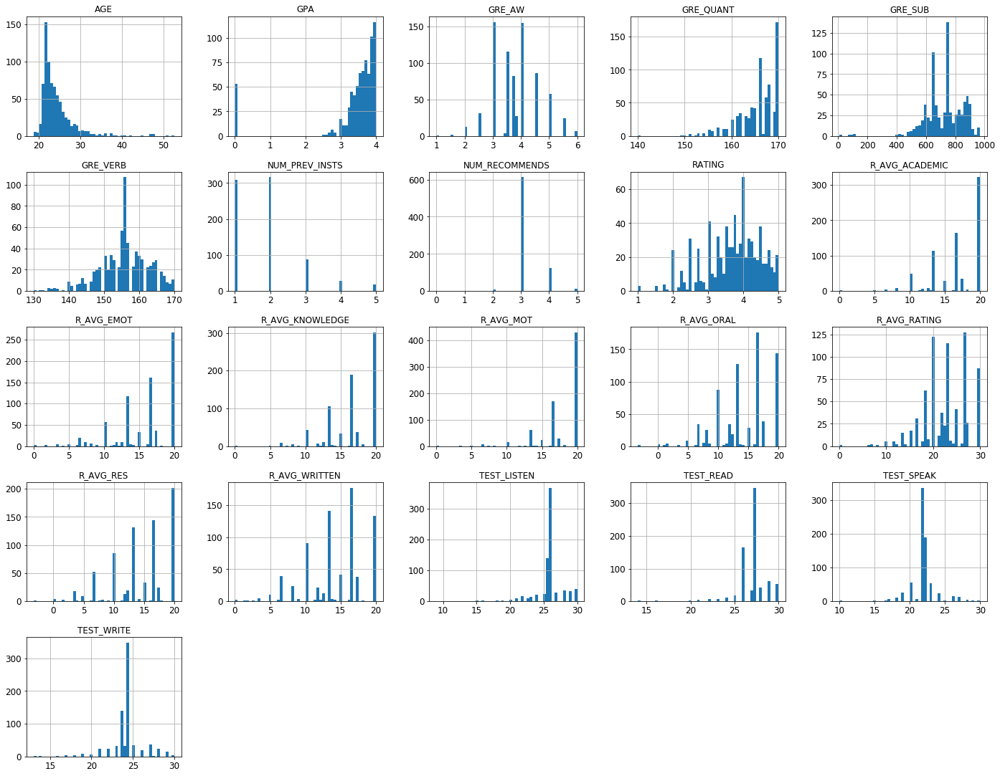

In [43]:
%matplotlib inline
import matplotlib.pyplot as plt
students.hist(bins=50, figsize=(24,19))
#save_fig("attribute_histogram_plots")
plt.show()

### Target Variable 


 mu = 3.69 and sigma = 0.78



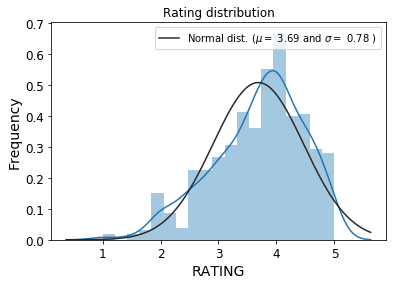

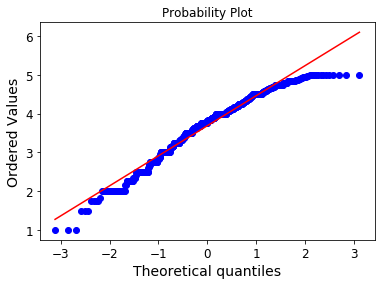

In [44]:
from scipy import stats
from scipy.stats import norm, skew #for some statistics
sns.distplot(students['RATING'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(students['RATING'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Rating distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(students['RATING'], plot=plt)
plt.show()

This is slightly left-skewed. But we will keep it this way. 

Now the data almost ready. We would like to convert categorical variables to numeric variables. 

### Converting categorical variables to numeric variables.

In [45]:
#students.head(12)

Many machine learning algorithms can support categorical values without further manipulation but there are many more algorithms that do not. For example, machine learning models, such as regression or SVM, are algebraic. This means that their input must be numerical. To use these models, categories must be transformed into numbers first, before you can apply the learning algorithm on them. Therefore, the analyst is faced with the challenge of figuring out how to turn these text attributes into numerical values for further processing.

We will use one hot encoding techninque to convert all the categorical variable into numeric variable. 

In [46]:
students_ce = students.copy()

import category_encoders as ce


encoder = ce.BinaryEncoder(cols=['Emphasis Area','Emphasis Area 2','Emphasis Area 3','UU_APPL_CITIZEN',
                                 'CTZNSHP','SEX','LOW_INCOME','UU_FIRSTGEN','UU_APPL_NTV_LANG',
                                 'HAS_LANGUAGE_TEST','HAS_GRE_GEN','HAS_GRE_SUBJECT','MAJOR'
                                 
                                ])
df_binary = encoder.fit_transform(students_ce)

df_binary.head()
df = df_binary
#df_binary.shape
#df_binary.info()

In [47]:
#df.info()
#df_binary.columns
#encoder = ce.BackwardDifferenceEncoder()
#df_bd = encoder.fit_transform(df_binary)
#df_bd.columns

# Overview of the methods.

## Gradient Descent

Gradient Descent is a very generic optimization algorithm capable of finding optimal
solutions to a wide range of problems. The general idea of Gradient Descent is to
tweak parameters iteratively in order to minimize a cost function.

MSE cost function for a Linear Regression model
$$ MSE(X,h_\theta)=\frac{1}{m}\sum_{i=1}^m \left(\theta^T \cdot x^{(i)}-y^{(i)}\right)^2$$
where 
$\theta$ is the model’s parameter vector, containing the bias term $\theta_0$ and the feature
weights $\theta_1$ to $\theta_n$.

- $\theta^T$ is the transpose of $\theta$ (a row vector instead of a column vector).
- $x$ is the instance’s feature vector, containing $x_0$ to $x_n$, with $x_0$ always equal to 1.
- $\theta^T \cdot x$ is the dot product of $\theta^T$ and $x$.
- $h_\theta$ is the hypothesis function, using the model parameters $\theta$.

Gradient Descent measures the local gradient of the error function with regards to the
parameter vector $\theta $, and it goes in the direction of descending gradient. Once the gradient
is zero, you have reached a minimum.

Concretely, you start by filling $\theta$ with random values (this is called random initialization),
and then you improve it gradually, taking one baby step at a time, each step
attempting to decrease the cost function (e.g., the MSE), until the algorithm converges
to a minimum.

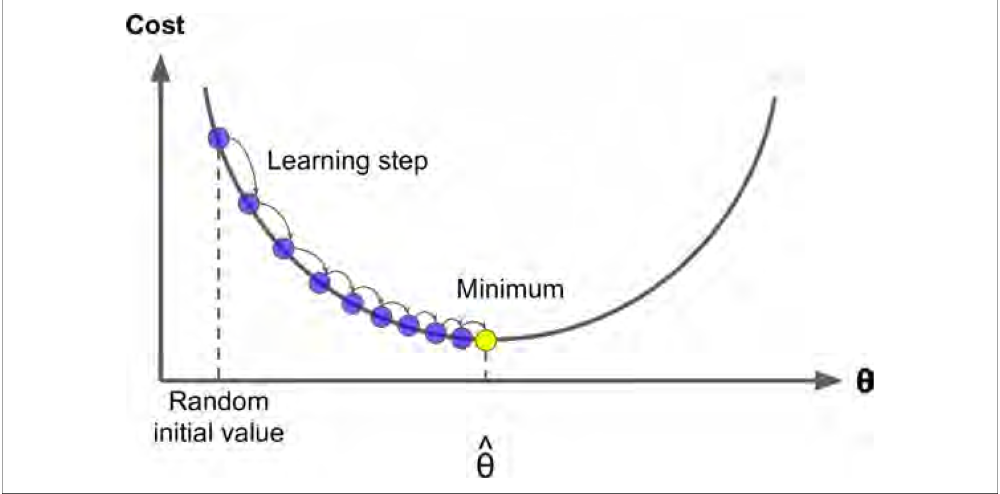

In [48]:
img_url = 'images/figure4-3.png';Embed = Image(img_url);Embed

An important parameter in Gradient Descent is the size of the steps, determined by
the learning rate hyperparameter. If the learning rate is too small, then the algorithm
will have to go through many iterations to converge, which will take a long time

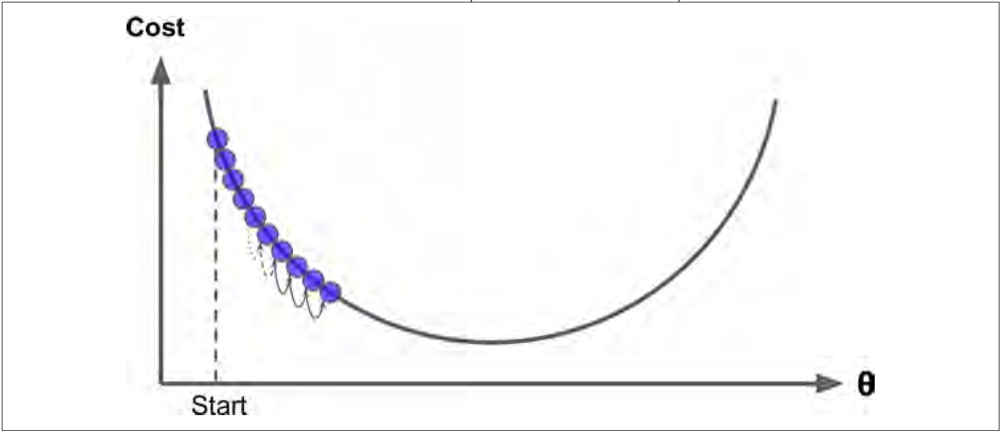

In [49]:
img_url = 'images/figure4-4.png';Embed = Image(img_url);Embed

On the other hand, if the learning rate is too high, you might jump across the valley
and end up on the other side, possibly even higher up than you were before. This
might make the algorithm diverge, with larger and larger values, failing to find a good
solution

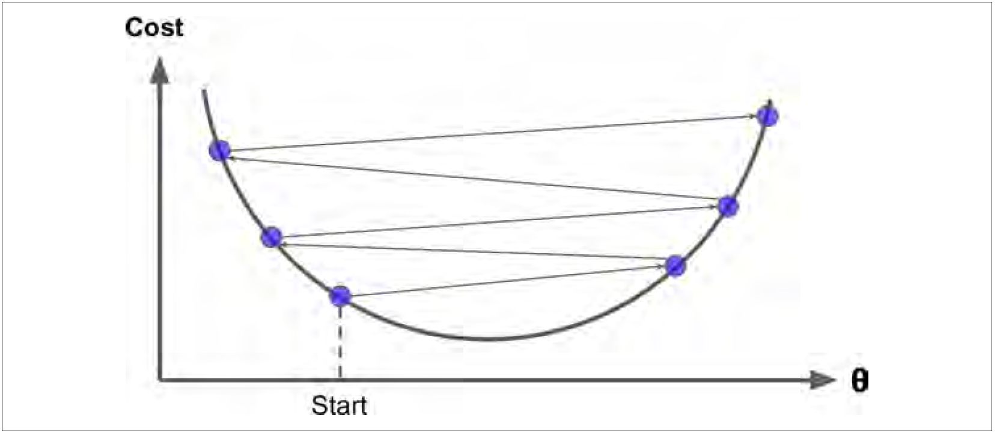

In [50]:
img_url = 'images/figure4-5.png';Embed = Image(img_url);Embed

Finally, not all cost functions look like nice regular bowls. There may be holes, ridges,
plateaus, and all sorts of irregular terrains, making convergence to the minimum very
difficult. Next figure  shows the two main challenges with Gradient Descent: if the random
initialization starts the algorithm on the left, then it will converge to a local minimum,
which is not as good as the global minimum. If it starts on the right, then it will
take a very long time to cross the plateau, and if you stop too early you will never
reach the global minimum.

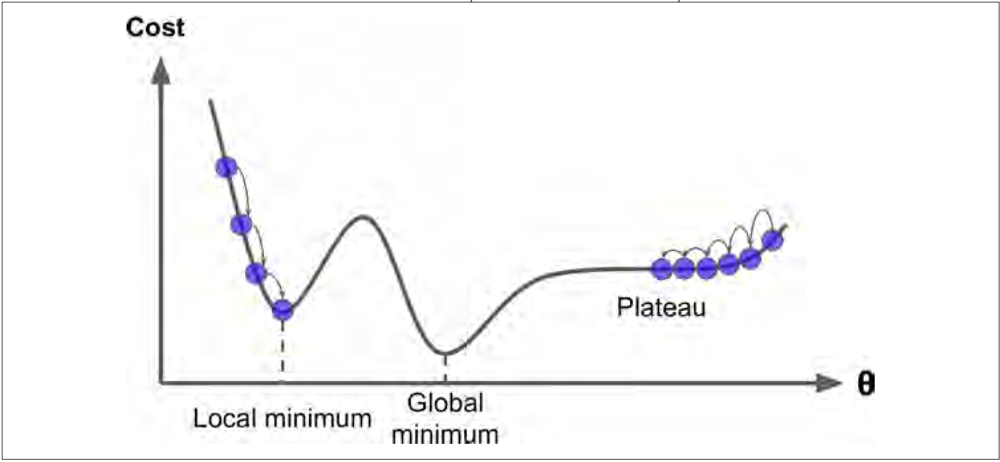

In [51]:
img_url = 'images/figure4-6.png';Embed = Image(img_url);Embed

Fortunately, the MSE cost function for a Linear Regression model happens to be a
convex function, which means that if you pick any two points on the curve, the line
segment joining them never crosses the curve. This implies that there are no local
minima, just one global minimum. It is also a continuous function with its derivative is Lipschitz continuous.
These two facts have a great consequence: Gradient Descent
is guaranteed to approach arbitrarily close the global minimum (if you wait long
enough and if the learning rate is not too high).

## Batch Gradient Descent

To implement Gradient Descent, you need to compute the gradient of the cost function with regards to each model parameter $\theta_j$. In other words, you need to calculate partial derivatives. 
$$\frac{\partial }{\partial \theta_j}MSE(\theta) = \frac{2}{m}\sum_{i=1}^m \left(\theta^T \cdot x^{(i)}-y^{(i)}\right)x^{(i)}_j$$

Instead of computing these gradients individually, you can use 
$$ \nabla_\theta MSE(\theta)= \frac{2}{m}X^T\cdot(X\cdot \theta-y) $$
to compute them all in one go. The gradient vector, noted $\nabla_\theta MSE(\theta)$, contains all the partial derivatives of the cost function (one for each model parameter).

Notice that this formula involves calculations over the full training set X, at each Gradient Descent step! This is why the algorithm is called Batch Gradient Descent: it uses the whole batch of training data at every step. As a result it is terribly slow on very large training sets (but we will see much faster Gradient Descent algorithms
shortly). However, Gradient Descent scales well with the number of features; training a Linear Regression model when there are hundreds of thousands of features is much faster using Gradient Descent than using the Normal Equation.

Once you have the gradient vector, which points uphill, just go in the opposite direction to go downhill. This means subtracting $\nabla_\theta MSE(\theta)$ from $\theta$. This is where the learning rate $\eta$ comes into play: multiply the gradient vector by $\eta$ to determine the size of the downhill step.
$$\theta^{next \; step }=\theta-\eta \nabla_\theta MSE(\theta) $$

But what if you had used a different learning rate $\eta$? The next figure shows the
first 10 steps of Gradient Descent using three different learning rates (the dashed line
represents the starting point). The blue lines show how the gradient descent starts and then slowly gets closer to the final value. The dots are points in our data. $y$ corresponds to output variable and $x_1$ is predictor.

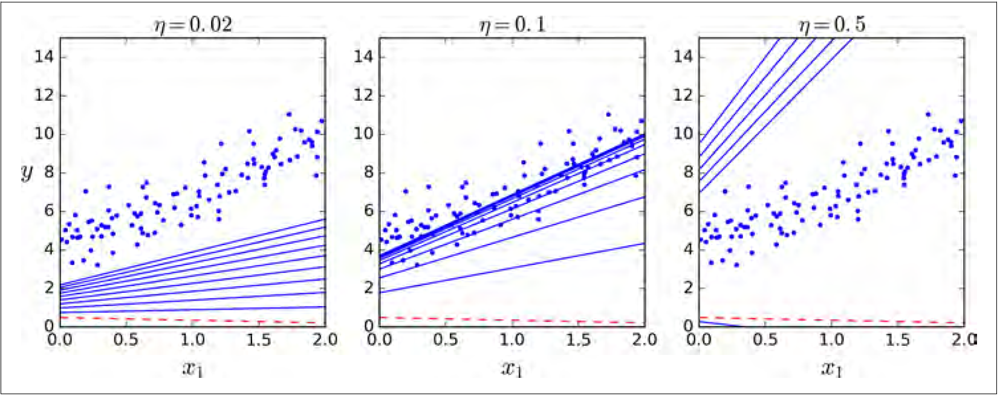

In [52]:
img_url = 'images/figure4-8.png';Embed = Image(img_url);Embed

On the left, the learning rate is too low: the algorithm will eventually reach the solution,
but it will take a long time. In the middle, the learning rate looks pretty good: in
just a few iterations, it has already converged to the solution. On the right, the learning
rate is too high: the algorithm diverges, jumping all over the place and actually
getting further and further away from the solution at every step.
To find a good learning rate, you can use grid search. However, you
may want to limit the number of iterations so that grid search can eliminate models
that take too long to converge.

## Stochastic Gradient Descent

## The main problem with Batch Gradient Descent is the fact that it uses the whole
training set to compute the gradients at every step, which makes it very slow when
the training set is large. At the opposite extreme, Stochastic Gradient Descent just
picks a random instance in the training set at every step and computes the gradients
based only on that single instance. Obviously this makes the algorithm much faster
since it has very little data to manipulate at every iteration. It also makes it possible to
train on huge training sets, since only one instance needs to be in memory at each
iteration (SGD can be implemented as an out-of-core algorithm.)

On the other hand, due to its stochastic (i.e., random) nature, this algorithm is much
less regular than Batch Gradient Descent: instead of gently decreasing until it reaches
the minimum, the cost function will bounce up and down, decreasing only on average.
Over time it will end up very close to the minimum, but once it gets there it will
continue to bounce around, never settling down. So once the algorithm
stops, the final parameter values are good, but not optimal.

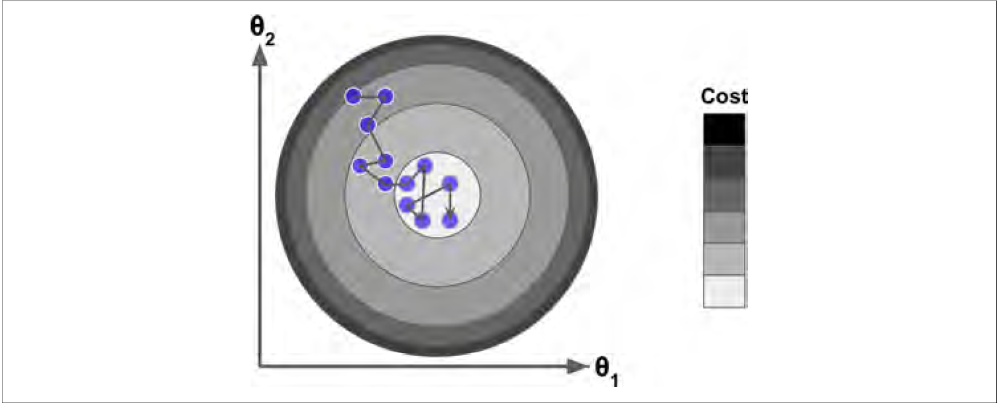

In [53]:
img_url = 'images/figure4-9.png';Embed = Image(img_url);Embed

When the cost function is very irregular, this can actually help the
algorithm jump out of local minima, so Stochastic Gradient Descent has a better
chance of finding the global minimum than Batch Gradient Descent does.

Therefore randomness is good to escape from local optima, but bad because it means
that the algorithm can never settle at the minimum. One solution to this dilemma is
to gradually reduce the learning rate. The steps start out large (which helps make
quick progress and escape local minima), then get smaller and smaller, allowing the
algorithm to settle at the global minimum. This process is called simulated annealing,
because it resembles the process of annealing in metallurgy where molten metal is
slowly cooled down. The function that determines the learning rate at each iteration
is called the learning schedule. If the learning rate is reduced too quickly, you may get
stuck in a local minimum, or even end up frozen halfway to the minimum. If the
learning rate is reduced too slowly, you may jump around the minimum for a long
time and end up with a suboptimal solution if you halt training too early.

By convention we iterate by rounds of m iterations; each round is called an epoch.

## Mini-batch Gradient Descent

The last Gradient Descent algorithm we will look at is called Mini-batch Gradient
Descent. It is quite simple to understand once you know Batch and Stochastic Gradient
Descent: at each step, instead of computing the gradients based on the full training
set (as in Batch GD) or based on just one instance (as in Stochastic GD), Minibatch GD computes the gradients on small random sets of instances called minibatches.

The main advantage of Mini-batch GD over Stochastic GD is that you can
get a performance boost from hardware optimization of matrix operations, especially
when using GPUs.

The algorithm’s progress in parameter space is less erratic than with SGD, especially
with fairly large mini-batches. As a result, Mini-batch GD will end up walking
around a bit closer to the minimum than SGD. But, on the other hand, it may be
harder for it to escape from local minima (in the case of problems that suffer from
local minima, unlike Linear Regression as we saw earlier). The next figure shows the
paths taken by the three Gradient Descent algorithms in parameter space during
training. They all end up near the minimum, but Batch GD’s path actually stops at the
minimum, while both Stochastic GD and Mini-batch GD continue to walk around.
However, don’t forget that Batch GD takes a lot of time to take each step, and Stochastic
GD and Mini-batch GD would also reach the minimum if you used a good learning
schedule.

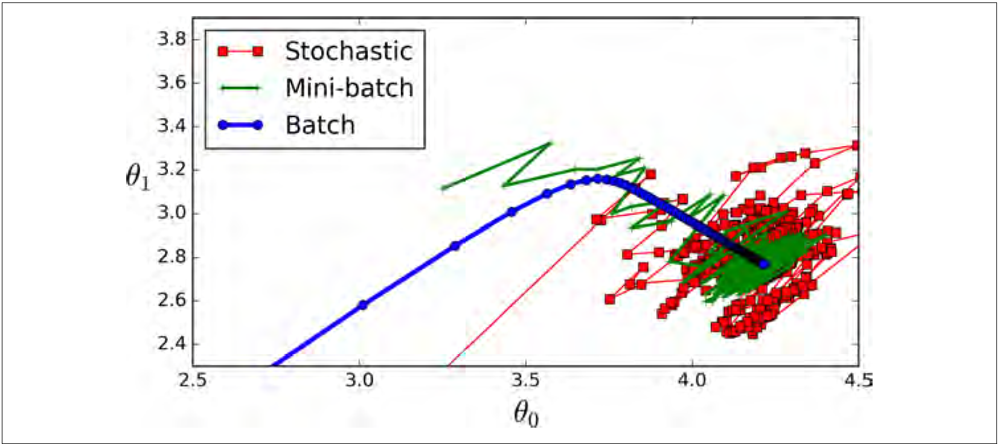

In [54]:
img_url = 'images/figure4-11.png';Embed = Image(img_url);Embed

## Neural Networks

### Building Blocks: Neurons

First, we have to talk about neurons, the basic unit of a neural network. A neuron takes inputs, does some math with them, and produces one output. Here’s what a 2-input neuron looks like:

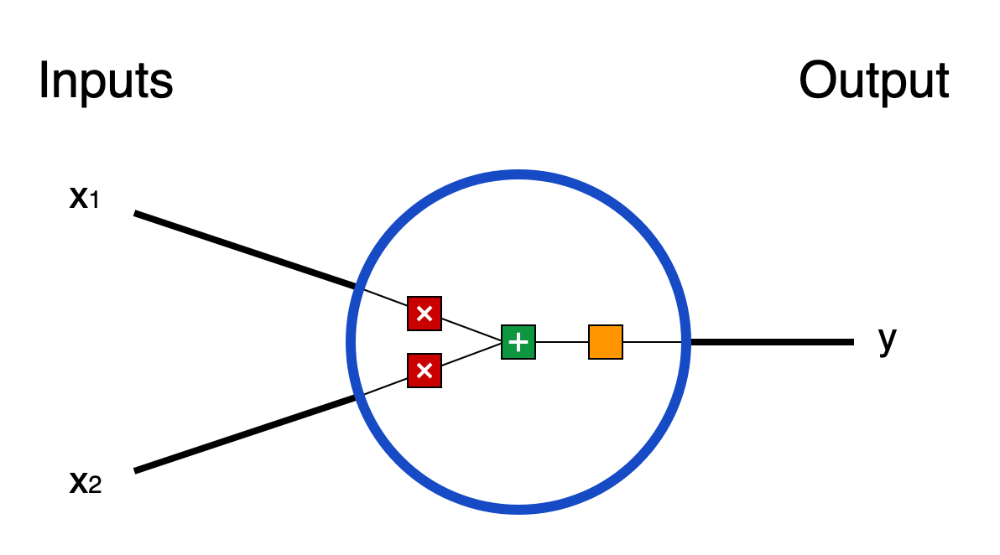

In [55]:
from IPython.display import Image
img_url = 'twoneurons.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

3 things are happening here. First, in a red square, each input is multiplied by a weight:

\begin{align}
x_1 & \to x_1* w_1\\
x_2 & \to x_2* w_2\\
\end{align}

Next, in a blue square, all the weighted inputs are added together with a bias b:

$$(x_1*w_1)+(x_2*w_2)+b$$

Finally, in the orange square, the sum is passed through an activation function

$$y=f(x_1*w_1+x_2*w_2+b)$$

The activation function is used to turn an unbounded input into an output that has a nice, predictable form. A commonly used activation function is the sigmoid function:
\begin{equation}
{\displaystyle S(x)={\frac {1}{1+e^{-x}}}={\frac {e^{x}}{e^{x}+1}}.}
\end{equation}

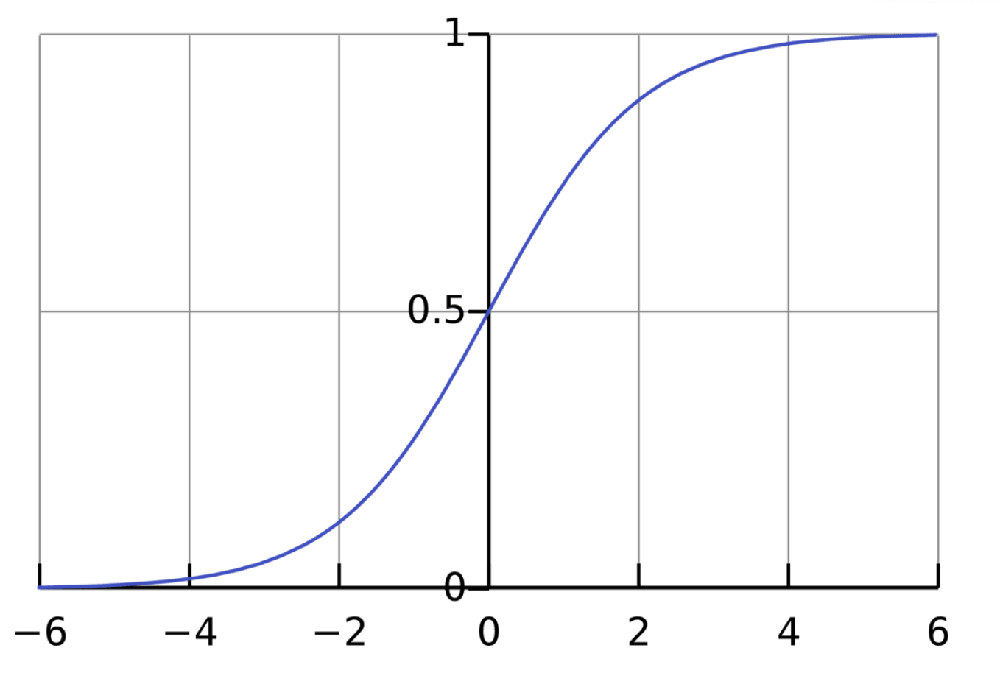

In [56]:
from IPython.display import Image
img_url = 'sigmoid.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

The sigmoid function only outputs numbers in the range (0,1). You can think of it as compressing $(-\infty, +\infty)$ to $(0,1)$ - big negative numbers become $\sim 0$, and big positive numbers become $\sim 1$

A sigmoid function is a bounded, differentiable, real function that is defined for all real input values and has a non-negative derivative at each point. A sigmoid "function" and a sigmoid "curve" refer to the same object.

### A Simple Example

Assume we have a 2-input neuron that uses the sigmoid activation function and has the following parameters:

\begin{align}
w &=(0,1) \\
b & = 4\\
\end{align}

where $w_1=0$ and $w_2=1$. Now, let’s give the neuron an input of $x=(2,3)$. We’ll use the dot product to write things more concisely:
\begin{align}
(w*x)+b= & ((w_1*x_1)+(w_2*x_2))+b \\
=& 0*2+1*3+4\\
=& 7\\
y=f(w*x+b)=&f(7)=1 / (1 + e^{-7})= 0.999
\end{align}

The neuron outputs 0.999 given the inputs $x=(2,3)$. That’s it! This process of passing inputs forward to get an output is known as feedforward.

### Combining Neurons into a Neural Network

A neural network is nothing more than a bunch of neurons connected together. Here’s what a simple neural network might look like:

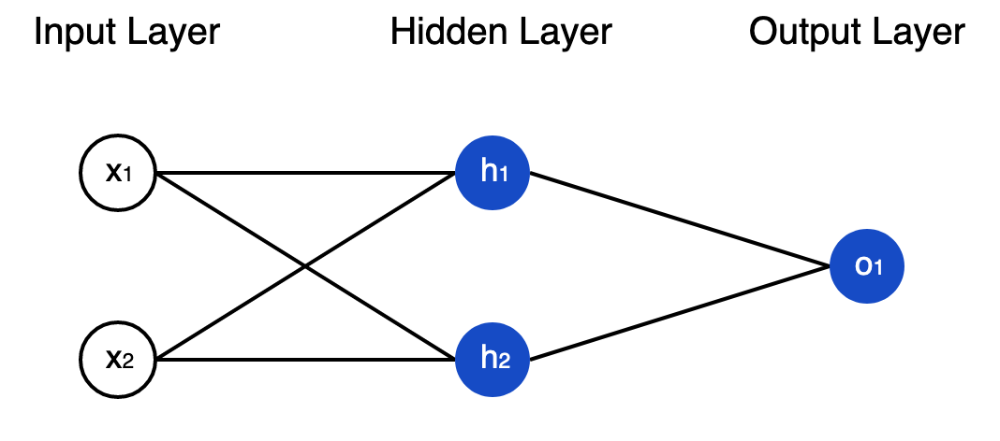

In [57]:
img_url = 'neuralnetwork.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

This network has 2 inputs, a hidden layer with 2 neurons $(h_1$ and $h_2)$, and an output layer with $1$ neuron $(o_1)$. Notice that the inputs for $o_1$ are the outputs from $h_1$and $h_2$- that’s what makes this a network.

A **hidden layer** is any layer between the input (first) layer and output (last) layer. There can be multiple hidden layers!

### An Example: Feedforward

Let’s use the network pictured above and assume all neurons have the same weights $w=(0,1)$, the same bias $b = 0$, and the same sigmoid activation function. Let $h_1, h_2, o_1$ denote the outputs of the neurons they represent.

What happens if we pass in the input $x = (2, 3)$?

\begin{align}
h_1=h_2&=f(w* x+b) \\
&=f((0* 2)+(1* 3)+0)\\
&=f(3)\\
&=1 / (1 + e^{-3})\\
&=0.9526 \\
o_1&=f(w* (h_1,h_2)+b)\\
&=f((0* h_1)+(1* h_2)+0)\\
&=f(0.9526)\\
&=1 / (1 + e^{-0.9526})\\
&=0.7216
\end{align}

The output of the neural network for input $x = (2, 3)$ is 0.7216. Pretty simple, right?

A neural network can have any number of layers with any number of neurons in those layers. The basic idea stays the same: feed the input(s) forward through the neurons in the network to get the output(s) at the end. For simplicity, we’ll keep using the network pictured above for the rest of this topic.

## Training a Neural Network

Say we have the following measurements: 

In [58]:
# print("Name    \tWeight(lb)\tHeight (in) \tGender")
# print("========\t=========\t===========\t===========")
# print("Alice   \t133       \t65         \tF")
# print("Bob     \t160       \t72         \tM")
# print("Charlie   \t152       \t70         \tM")
# print("Diana    \t120        \t60         \tF")

| Name          | Weight(lb)    | Height(in) | Gender | 
| ------------- |:-------------:| ---------: | -------|
| Alice         | 132           |  65        |   F    |
| Bob           | 160           |    72      |      M |
| Charlie       | 152           |     75     |     M  |
| Diana         | 120           |      60    |      F |

Let’s train our network to predict someone’s gender given their weight and height:

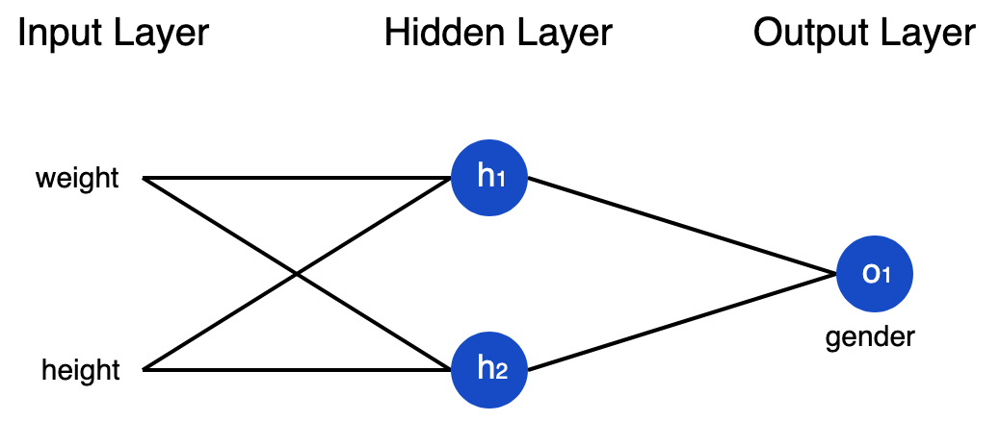

In [59]:
img_url = 'neuralnetworktraining.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

We’ll represent Male with a 0 and Female with a 1, and we will also shift the data to make it easier to use:

| Name          | Weight (minus 141)| Height (minus 68 ) | Gender | 
| ------------- |:-------------:| ---------: | -------|
| Alice         | -9           |  -3        |   1    |
| Bob           | 19           |    4      |      0 |
| Charlie       | 11           |     7    |     0  |
| Diana         | -21           |      -8    |      1 |

Here, note that $(132+160+152+120)/4=141$ and $(65+72+75+60)/4=68$

#### Loss

Before we train our network, we first need a way to quantify how "good" it's doing so that it can try to do "better". That's what the **loss** is.

We'll use the **mean squared error** (MSE) loss:

$$ MSE = \frac{1}{n}\sum_{i=1}^{n}(y_{true}-y_{pred})^2$$

Let's break this down:
- n is the number of samples, which is 4.
- y represents the variable being predicted, which is Gender.
- $y_{true}$ is the true value of the variable. For example, $y_{true}$ for Alice would be 1 (Female).
- $y_{pred}$ is the predicted value of the variable. It’s whatever our network outputs.

$(y_{true}-y_{pred})^2$ is known as the squared error. Our loss function is simply taking the average over all squared errors (hence the name mean squared error). The better our predictions are, the lower our loss will be!

**Training a network = trying to minimize its loss.**

#### An Example Loss Calculation

Let’s say our network always outputs 0 - in other words, it's confident all humans are Male 🤔. What would our loss be?

Let  diff =   $(y_{true}-y_{pred})^2$

| Name          | $y_{true}$    | $y_{pred}$ | diff|
| --------------|---------------| -------------| ---------------------|
| Alice         | 1             |  0         |  1                     |
| Bob           | 0             |    0       |     0 |
| Charlie       | 0             |     0      |     0  |
| Diana         | 1            |      0      |      1 |


$$ MSE = \frac{1}{4}(1+0+0+1)=0.5 $$

We now have a clear goal: minimize the loss of the neural network. We know we can change the network's weights and biases to influence its predictions, but how do we do so in a way that decreases loss?

For simplicity, let's pretend we only have Alice in our dataset:

| Name          | Weight (minus 141)| Height (minus 68 ) | Gender | 
| ------------- |:-------------:| ---------: | -------|
| Alice         | -9           |  -3        |   1    |

Then the mean squared error loss is just Alice’s squared error:

\begin{align}
MSE&=\frac{1}{1}\sum_{i=1}^1(y_{true}−y_{pred})^2\\
&=(y_{true}−y_{pred})^2\\
& =(1−y_{pred})^2
\end{align}

Another way to think about loss is as a function of weights and biases. Let’s label each weight and bias in our network:

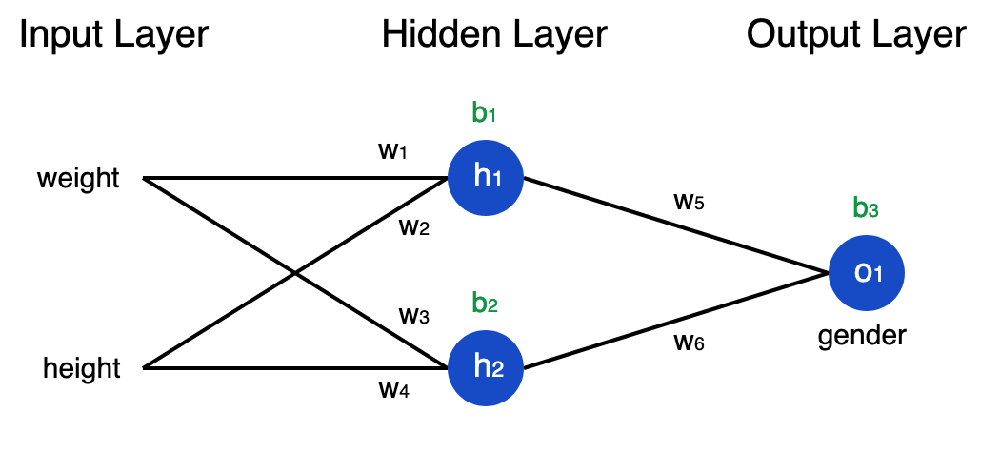

In [60]:
img_url = 'neuralnetworktraning2.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

Then, we can write loss as a multivariable function:
 $$L(w_1,w_2,w_3,w_4,w_5,w_6,b_1,b_2,b_3)$$

Imagine we wanted to tweak $w_1$. How would loss $L$ change if we changed $w_1$? That's a question the partial derivative $\frac{\partial L}{\partial w_1}$can answer. How do we calculate it?

To start, let's rewrite the partial derivative in terms of $\frac{\partial y_{pred}}{\partial w_1}$ instead:
 $$\dfrac{\partial L}{\partial w_1}= \dfrac{\partial L}{\partial y_{pred}}*\dfrac{\partial y_{pred}}{\partial w_1} $$


We can calculate $\frac{\partial L}{\partial y_{pred}}$ because we computed $L = (1 - y_{pred})^2$ above:

$$\dfrac{\partial L}{\partial y_{pred}} = \dfrac{\partial (1 - y_{pred})^2}{\partial y_{pred}}= -2(1-y_{pred})$$

Now, let's figure out what to do with $\frac{\partial y_{pred}}{\partial w_1}$. Just like before, let $h_1, h_2, o_1$ be the outputs of the neurons they represent. Then

$$ y_{pred}=o_1=f(w_5*h_1+w_6*h_2+b_3)$$

Since $w_1$ only affects $h_1$ (not $h_2$), we can write


$$\dfrac{\partial y_{pred}}{\partial w_1} =\dfrac{\partial y_{pred}}{\partial h_1} *\dfrac{\partial h_1}{\partial w_1} $$
Also note that by using chain rule,
$$ \dfrac{\partial y_{pred}}{\partial h_1} = w_5*f'(w_5h_1+w_6h_2+b_3)$$
Recall $h_1 = f(w_1x_1+w_2x_2+b_1)$. Thus, we can do the same thing for $\frac{\partial h_1}{\partial w_1}  $:
$$ \dfrac{\partial h_1}{\partial w_1} = x_1*f'(w_1x_1+w_2x_2+b_1)$$
$x_1$ here is weight, and $x_2$ is height. This is the second time we've seen $f'(x)$ (the derivate of the sigmoid function) now! Let’s derive it:

$$ f(x) = \dfrac{1}{1+e^{-x}}$$
By taking derivative, we get
$$f'(x)= \dfrac{e^{-x}}{(1 + e^{-x})^2}=f(x) * (1 - f(x))$$


We'll use this nice form for $f'(x)$ later. This form shows we do not need to take a derivative. 

We're done! We've managed to break down $\frac{\partial L}{\partial w_1}$ into several parts we can calculate it now:
$$\dfrac{\partial L}{\partial w_1} = \dfrac{\partial L}{\partial y_{pred}}*\dfrac{\partial y_{pred}}{\partial h_1}*\dfrac{\partial h_1}{\partial w_1}  $$

This system of calculating partial derivatives by working backwards is known as backpropagation, or "backprop".

### Example: Calculating the Partial Derivative

We're going to continue pretending only Alice is in our dataset:

| Name          | Weight (minus 141)| Height (minus 68 ) | Gender | 
| ------------- |:-------------:| ---------: | -------|
| Alice         | -9           |  -3        |   1    |

Let's initialize all the weights to 1 and all the biases to 0. If we do a feedforward pass through the network, we get:

$$ h_1 =f(w_1*x_1+w_2*x_2+b_1)=f(−9+−3+0)=6.16*10^{-6}$$
and similarly
$$h_2 =f(w_3*x_1+w_4*x_2+b_2)=f(−9+−3+0)=6.16*10^{-6} $$
and now let us calculate $o_1$
$$o_1 =f(w_5*h_1+w_6*h_2+b_3)=f(6.16*10^{-6}+6.16*10^{-6}+0)=0.50$$

The network outputs $y_{pred} = 0.50$, which doesn't  favor Male(0) or Female (1). This totally makes sense because we do not do any training yet.

Let's calculate $\frac{\partial L}{\partial w_1}$:



\begin{aligned}
\dfrac{\partial L}{\partial w_1} =& \dfrac{\partial L}{\partial y_{pred}}*\dfrac{\partial y_{pred}}{\partial h_1}*\dfrac{\partial h_1}{\partial w_1}\\
\end{aligned}
Now let us calculate each of the terms on the RHS one by one.
\begin{aligned} 
\dfrac{\partial L}{\partial y_{pred}} &= -2(1 - y_{pred}) \\ 
&= -2(1 - 0.50) \\ &= -1 \\ 
\end{aligned}
and 
\begin{aligned} 
\dfrac{\partial y_{pred}}{\partial h_1} &= w_5 * f'(w_5h_1 + w_6h_2 + b_3) \\ 
&= 1 * f'(6.16* 10^{-6} + 6.16* 10^{-6}+ 0) \\ 
&= f(1.23* 10^{-5}) * (1 - f(1.23* 10^{-5})) \\ 
&= 0.249 \\ 
\end{aligned}
lastly
\begin{aligned} 
\dfrac{\partial h_1}{\partial w_1} &= x_1 * f'(w_1x_1 + w_2x_2 + b_1) \\ 
&= -9 * f'(-9 + -3 + 0) \\ 
&= -9 * f(-12) * (1 - f(-12)) \\ 
&= -5.52* 10^{-5} \\ 
\end{aligned}
Now, we can collect them all and write
\begin{aligned} 
\dfrac{\partial L}{\partial w_1} &= -1 * 0.249 * -5.52* 10^{-5} \\ &= \boxed{1.37* 10^{-5}} \\ 
\end{aligned}

We did it! This tells us that if we were to increase $w_1$, $L$ would increase a tiny bit as a result.

### Training: Stochastic Gradient Descent

We have all the tools we need to train a neural network now! We’ll use an optimization algorithm called stochastic gradient descent (SGD) that tells us how to change our weights and biases to minimize loss. It’s basically just this update equation

$$ w_1\leftarrow w_1-\eta \dfrac{\partial L}{\partial w_1}$$

$\eta$ is a constant called the learning rate that controls how fast we train. All we're doing is subtracting $\eta \frac{\partial L}{\partial w_1}$ from $w_1$:

- If $\frac{\partial L}{\partial w_1}$ is positive, $w_1$ will decrease, which makes $L$ decrease.
- If $\frac{\partial L}{\partial w_1}$ is negative, $w_1$ will increase, which makes $L$ increase.

If we do this for every weight and bias in the network, the loss will slowly decrease and our network will improve.

Our training process will look like this:

1. Choose one sample from our dataset. This is what makes it stochastic gradient descent - we only operate on one sample at a time.
2. Calculate all the partial derivatives of loss with respect to weights or biases (e.g. $\frac{\partial L}{\partial w_1}$,$\frac{\partial L}{\partial w_2}$, etc).
3. Use the update equation to update each weight and bias.
4. Go back to step 1.


# Applying Machine Learning to predict DECISION using RATING

## Splitting Data Set

We are splitting the data into two parts train and test data. We will test our algorithm after we trained on a train data. We will be using cross validation technique on a train data. 

In [61]:
# let us divide this into train and test data
X_train, X_test, Y_train, Y_test = train_test_split(
    df.loc[:, df.columns != 'DECISION'], 
    df['DECISION'], test_size = 0.2, random_state=0)
#print(X_train.shape)
#print(Y_train.shape)
#print(X_test.shape)
#print(Y_test.shape)

In [62]:
#X_train.info()
#Y_train

In [63]:
#cleanup_nums = {"DECISION": {"Admit": 1, "Waitlist": 2, "Reject": 3 }}
#df.replace(cleanup_nums, inplace=True)

In [64]:
#df["DECISION"] = df["DECISION"].astype('category')

In [65]:
#df.info()

## Scaling

This is a crucial step in rescaling input data so that all the features are mean zero with a unit variance. 

In [66]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

First, we will estimate DECISION using RATING variable. After predicting the decision, we will be predicting RATING  variable. When we predict RATING, we wil not be using decision variable.

### Boosting
Boosting (originally called hypothesis boosting) refers to any Ensemble method that
can combine several weak learners into a strong learner. The general idea of most
boosting methods is to train predictors sequentially, each trying to correct its predecessor.
There are many boosting methods available, but by far the most popular are
AdaBoost(short for Adaptive Boosting) and Gradient Boosting and XGBoost. Let’s start with Ada‐
Boost.

## Adaptive Boosting

One way for a new predictor to correct its predecessor is to pay a bit more attention
to the training instances that the predecessor underfitted. This results in new predictors
focusing more and more on the hard cases. This is the technique used by Ada‐
Boost.
For example, to build an AdaBoost classifier, a first base classifier (such as a Decision
Tree) is trained and used to make predictions on the training set. The relative weight
of misclassified training instances is then increased. A second classifier is trained
using the updated weights and again it makes predictions on the training set, weights
are updated, and so on. The next figure explains the structure.

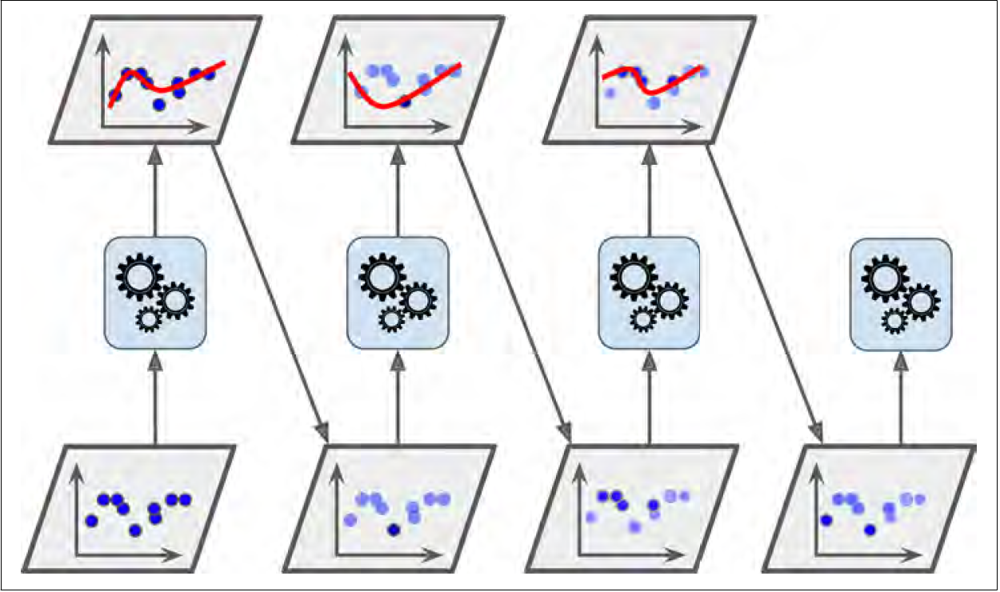

In [67]:
img_url = 'images/figure7-7.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

In [68]:

classifier = AdaBoostClassifier(base_estimator = None, 
                            algorithm = 'SAMME',n_estimators=100, learning_rate=1.0)
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
adaboost = cm.trace()/cm.sum()
print('Accuracy on a test set: ', adaboost)

Accuracy on a train set:  0.7248764415156508
[[ 8  5 10]
 [ 1 66 12]
 [ 5 11 34]]
Accuracy on a test set:  0.7105263157894737


## Decision Tree

Decision Trees are also the fundamental components of Random Forests which are among the most powerful Machine Learning algorithms available today. To understand Decision Trees, let’s just visualize one and take a look at how it makes predictions.

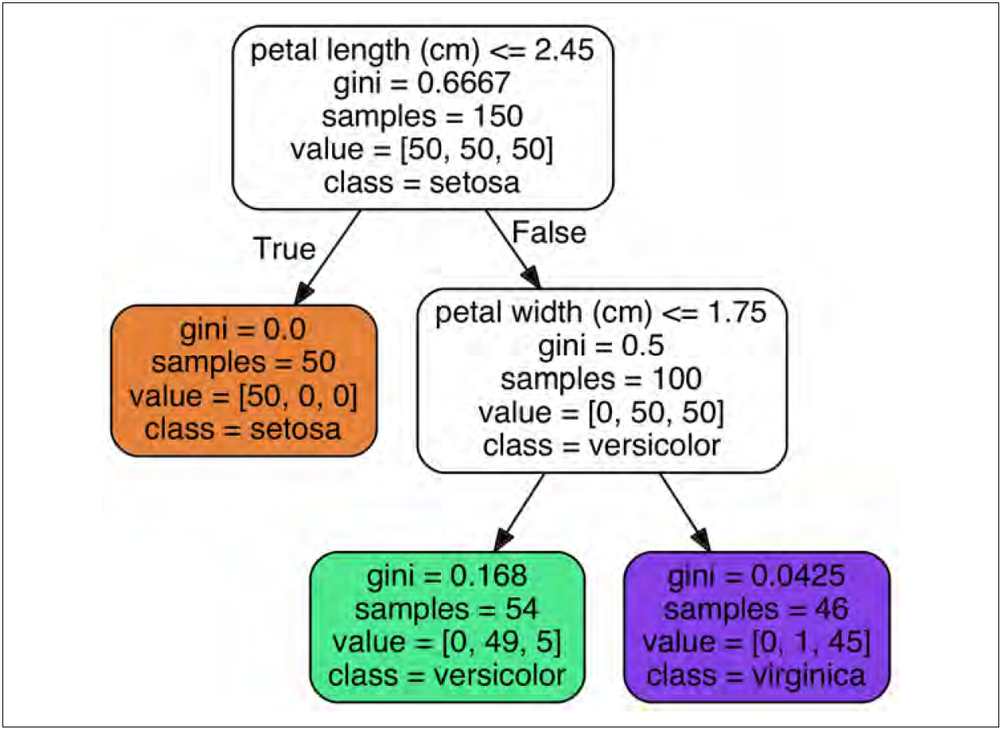

In [69]:
img_url = 'images/figure6-1.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

In [70]:
#img_url = 'images/MStat/d_tree.png';Embed      = Image(img_url);Embed

Let’s see how the tree represented in the figure above makes predictions. Assume you are looking iris data set.  Suppose you find an iris flower and you want to classify it. You start at the root node (depth 0, at the
top): this node asks whether the flower’s petal length is smaller than 2.45 cm. If it is,
then you move down to the root’s left child node (depth 1, left). In this case, it is a leaf
node (i.e., it does not have any children nodes), so it does not ask any questions: you
can simply look at the predicted class for that node and the Decision Tree predicts
that your flower is an Iris-Setosa (class=setosa).

Now suppose you find another flower, but this time the petal length is greater than
2.45 cm. You must move down to the root’s right child node (depth 1, right), which is
not a leaf node, so it asks another question: is the petal width smaller than 1.75 cm? If
it is, then your flower is most likely an Iris-Versicolor (depth 2, left). If not, it is likely
an Iris-Virginica (depth 2, right). It’s really that simple.

In [71]:
# Where to save the figures
# PROJECT_ROOT_DIR = "."
CHAPTER_ID = "Mstat"

def image_path(fig_id):
    return os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id)
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
# iris = load_iris()
# X = iris.data[:, 2:] # petal length and width
# y = iris.target
# tree_clf = DecisionTreeClassifier(max_depth=2)
# tree_clf.fit(X, y)
# from sklearn.tree import export_graphviz
# export_graphviz(tree_clf, 
#                 out_file=image_path("iris_tree.dot"), 
#                 feature_names=iris.feature_names[2:], 
#                 class_names=iris.target_names, 
#                 rounded=True,
#                 filled=True)

In [72]:
#list(df2.columns)
#iris.target_names

In [73]:
# #np.asarray(list(df3))
# # df['DECISION'] = pd.Categorical(df['DECISION'])
# # idx = df['DECISION'].cat.categories
# # print(idx)
# # print(np.asarray(idx))

# idx =  pd.Index(list(df3))
# idx.get_level_values(0)

It will be very similar structure in our case however decision tree will be big because of number of variables. We will be showing one decision tree in order to give us an idea. 

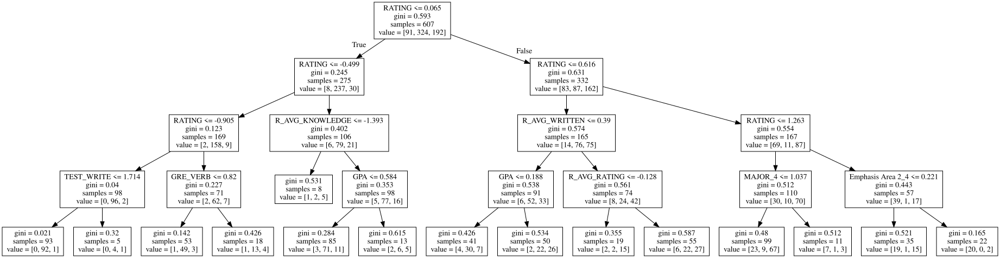

In [74]:




df2= df.iloc[:,:72]
#df2.columns
#df3 = df.iloc[:,72:73]
#df3.columns
import graphviz
from sklearn import tree
clf = tree.DecisionTreeClassifier(criterion = 'gini',max_depth =4,min_samples_leaf =5)
clf = clf.fit(X_train,Y_train)
dot_data = tree.export_graphviz(clf,out_file = None,feature_names = list(df2.columns))
graph = graphviz.Source(dot_data)
graph

In [165]:
import graphviz
from uuid import uuid4

def drawNode(graph, tree):
    node_id = uuid4().hex
    if isinstance(tree, Leaf):
        graph.node(node_id, shape="oval", label="%s" % tree.prediction)
        return node_id
    else:
        graph.node(node_id, shape="box", label="%s" % tree.question)
        left_id = drawNode(graph, tree.left)
        graph.edge(node_id, left_id, label="F")
        right_id = drawNode(graph, tree.right)
        graph.edge(node_id, right_id, label="T")
        return node_id

def drawTree(tree):
    graph = graphviz.Digraph(comment="Decision Tree")
    drawNode(graph, tree)
    return graph




In [166]:
def unique_vals(data,col):
    return set([row[col] for row in data])

def class_counts(data): #make a dictionary that counts the labels
    counts = {}
    for row in data:
        label = row[-1]
        if label not in counts:
            counts[label] = 0
        counts[label] += 1
    return counts

def is_numeric(value):
    return isinstance(value,int) or isinstance(value,float)

class Question:

    def __init__(self, column, value):
        self.column = column
        self.value = value

    def match(self,row):
        val = row[self.column]
        if is_numeric(val):
            return val >= self.value
        else:
            return val == self.value

    def __repr__(self):
        if is_numeric(self.value):
            condition = '>='
        else:
            condition = '=='
        return "Is %s %s %s?" % (header[self.column], condition,
str(self.value))

def partition(data,question):
    right_region, left_region = [],[]
    for row in data:
        if question.match(row):
            right_region.append(row)
        else:
            left_region.append(row)
    return right_region, left_region

def gini(data):
    counts = class_counts(data)
    impurity = 0
    for lbl in counts:
        prob_of_lbl = counts[lbl]/len(data)
        impurity += prob_of_lbl**2
    return 1-impurity

def info_gain(left,right,old_info):
    p = len(right)/(len(left)+len(right))
    return old_info - p*gini(right)-(1-p)*gini(left)

def find_best_split(data):
    best_gain=0
    best_question=None
    old_info = gini(data)
    n_features = len(data[0])-1

    for col in range(n_features):
        values = set([row[col] for row in data]) #set of unique values
        for val in values:
            question = Question(col,val)
            right_region,left_region = partition(data,question)
            if len(right_region)==0 or len(left_region)==0:
                continue
            gain = info_gain(right_region,left_region,old_info)
            if gain > best_gain: #can be > and get the same quality of split
                best_gain,best_question = gain,question
    return best_gain, best_question

class Leaf:
    def __init__(self,data):
        self.prediction = class_counts(data)

class Decision_Node:
    def __init__(self, question, right_branch, left_branch):
        self.question = question
        self.right = right_branch
        self.left = left_branch

def build_tree(data):

    gain,question = find_best_split(data)

    if gain==0:
        return Leaf(data)

    right_region, left_region = partition(data,question)
    right_branch = build_tree(right_region)
    left_branch = build_tree(left_region)

    return Decision_Node(question, right_branch, left_branch)

In [167]:
import numpy as np

def is_numeric(value):
    return isinstance(value, (int,float,np.int64))

In [168]:
def find_best_split(data, min_leaf =5):
    best_gain=0
    best_question=None
    old_info = gini(data)
    n_features = len(data[0])-1

    for col in range(n_features):
        values = set([row[col] for row in data]) #set of unique values
        for val in values:
            question = Question(col,val)
            right_region,left_region = partition(data,question)
            if len(right_region)<min_leaf or len(left_region)<min_leaf:
                continue
            gain = info_gain(right_region,left_region,old_info)
            if gain > best_gain: #can be > and get the same quality of split
                best_gain,best_question = gain,question
    return best_gain, best_question

In [169]:
def build_tree(data,min_leaf=5, max_depth=4, depth=0):

    gain,question = find_best_split(data, min_leaf)

    if gain==0 or (depth>=max_depth):
        return Leaf(data)

    right_region, left_region = partition(data,question)
    right_branch = build_tree(right_region,min_leaf,max_depth,depth+1)
    left_branch = build_tree(left_region,min_leaf,max_depth,depth+1)

    return Decision_Node(question, right_branch, left_branch)

In [193]:
# df2= df.copy()
# #my_tree  =build_tree(df2)
# df2
students_pd = students.copy()
X_train_pd, X_test_pd, Y_train_pd, Y_test_pd = train_test_split(
    students_pd.loc[:, students_pd.columns != 'DECISION'], 
    students_pd['DECISION'], test_size = 0.2, random_state=0)
print(X_train_pd.shape)
print(X_test_pd.shape)
print(Y_train_pd.shape)
print(Y_test_pd.shape)


(607, 34)
(152, 34)
(607,)
(152,)


In [194]:
X_trainNP = X_train_pd.values
Y_trainNP = Y_train_pd.values
X_testNP = X_test_pd.values
Y_testNP = Y_test_pd.values


In [195]:
data_train = np.hstack((X_trainNP,Y_trainNP.reshape((X_train.shape[0],1))))

In [196]:
data_train = list(data_train)
data_train  = [list(row) for row in data_train]
type(data_train)

list

In [197]:
my_tree  =build_tree(data_train)

In [200]:
#students_pd.columns
header = ['Emphasis Area', 'Emphasis Area 2', 'Emphasis Area 3',
       'UU_APPL_CITIZEN', 'CTZNSHP', 'AGE', 'SEX', 'LOW_INCOME', 'UU_FIRSTGEN',
       'UU_APPL_NTV_LANG', 'HAS_LANGUAGE_TEST', 'TEST_READ', 'TEST_SPEAK',
       'TEST_WRITE', 'TEST_LISTEN', 'MAJOR', 'GPA', 'NUM_PREV_INSTS',
       'HAS_GRE_GEN', 'GRE_VERB', 'GRE_QUANT', 'GRE_AW', 'HAS_GRE_SUBJECT',
       'GRE_SUB', 'NUM_RECOMMENDS', 'R_AVG_ORAL', 'R_AVG_WRITTEN',
       'R_AVG_ACADEMIC', 'R_AVG_KNOWLEDGE', 'R_AVG_EMOT', 'R_AVG_MOT',
       'R_AVG_RES', 'R_AVG_RATING', 'RATING', 'DECISION']

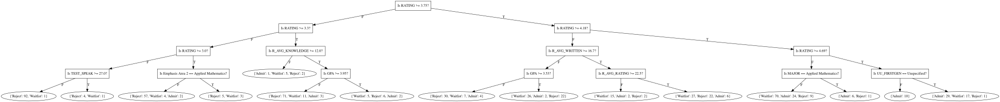

In [202]:
### 
graph  =  drawTree(my_tree)
graph

In the figure below, we see that left bottom corner the number of samples are 93 with 0 admitted, 92 rejected and 1 waitlisted. As we expected the rating is the most strong. 

In [75]:
# #iris = load_iris()
# #X = iris.data[:, 2:] # petal length and width
# #y = iris.target
# tree_clf = DecisionTreeClassifier(max_depth=2)
# tree_clf.fit(X_train, Y_train)
# from sklearn.tree import export_graphviz
# export_graphviz(tree_clf, 
#                 out_file=image_path("d_tree2.dot"), 
#                 feature_names=list(df2.columns), 
#                 class_names=idx, 
#                 rounded=True,
#                 filled=True)

In [76]:
#Now let us the how decision tree algorithm works on our data set.

In [77]:
classifier = DecisionTreeClassifier(criterion = 'entropy',random_state = 0)
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
#print(accuracy_score(Y_test, Y_pred))
d_tree = cm.trace()/cm.sum()
print('Accuracy on a test set: ', d_tree)

Accuracy on a train set:  1.0
[[ 6  5 12]
 [ 2 59 18]
 [16 10 24]]
Accuracy on a test set:  0.5855263157894737


## Gaussian Naive Bayes

In machine learning, naive Bayes classifiers are a family of simple "probabilistic classifiers" based on applying Bayes' theorem with strong (naïve) independence assumptions between the features. They are among the simplest Bayesian network models.

Naive Bayes is a simple technique for constructing classifiers: models that assign class labels to problem instances, represented as vectors of feature values, where the class labels are drawn from some finite set. There is not a single algorithm for training such classifiers, but a family of algorithms based on a common principle: all naive Bayes classifiers assume that the value of a particular feature is independent of the value of any other feature, given the class variable. For example, a fruit may be considered to be an apple if it is red, round, and about 10 cm in diameter. A naive Bayes classifier considers each of these features to contribute independently to the probability that this fruit is an apple, regardless of any possible correlations between the color, roundness, and diameter features. 

In [78]:
classifier = GaussianNB()
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
gnb=cm.trace()/cm.sum()
print('Accuracy on a test set: ', gnb)

Accuracy on a train set:  0.21087314662273476
[[21  2  0]
 [69 10  0]
 [50  0  0]]
Accuracy on a test set:  0.20394736842105263


## K Nearest Neighbor

In pattern recognition, the k-nearest neighbors algorithm (k-NN) is a non-parametric method used for classification and regression. In both cases, the input consists of the k closest training examples in the feature space. The output depends on whether k-NN is used for classification or regression:

 - In k-NN classification, the output is a class membership. An object is classified by a plurality vote of its neighbors, with the object being assigned to the class most common among its k nearest neighbors (k is a positive integer, typically small). If k = 1, then the object is simply assigned to the class of that single nearest neighbor.

 - In k-NN regression, the output is the property value for the object. This value is the average of the values of k nearest neighbors.

In [79]:
classifier = KNeighborsClassifier(leaf_size = 100, p=2)
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
knn = cm.trace()/cm.sum()
print('Accuracy on a test set: ', knn)

Accuracy on a train set:  0.7051070840197694
[[ 5 11  7]
 [ 3 57 19]
 [ 6 29 15]]
Accuracy on a test set:  0.506578947368421


## Support Vector Machine

A Support Vector Machine (SVM) is a very powerful and versatile Machine Learning
model, capable of performing linear or nonlinear classification, regression, and even
outlier detection. It is one of the most popular models in Machine Learning, and anyone
interested in Machine Learning should have it in their toolbox. SVMs are particularly
well suited for classification of complex but small- or medium-sized datasets.

The fundamental idea behind SVMs is best explained with some picture. The figure below shows part of the iris dataset that was introduced before. The two
classes can clearly be separated easily with a straight line (they are linearly separable).
The left plot shows the decision boundaries of three possible linear classifiers. The
model whose decision boundary is represented by the dashed line is so bad that it
does not even separate the classes properly. The other two models work perfectly on
this training set, but their decision boundaries come so close to the instances that
these models will probably not perform as well on new instances. In contrast, the
solid line in the plot on the right represents the decision boundary of an SVM classifier;
this line not only separates the two classes but also stays as far away from the
closest training instances as possible. You can think of an SVM classifier as fitting the
widest possible street (represented by the parallel dashed lines) between the classes.

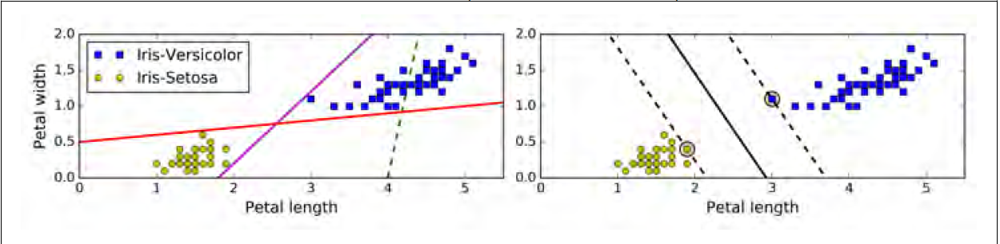

In [80]:
img_url = 'images/figure5-1.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

In [81]:
classifier = SVC(max_iter = 10000, random_state = 0, gamma = 'auto')
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
svm = cm.trace()/cm.sum()
print('Accuracy on a test set: ', svm)

Accuracy on a train set:  0.8154859967051071
[[ 0  9 14]
 [ 1 64 14]
 [ 2 26 22]]
Accuracy on a test set:  0.5657894736842105


In [82]:
# classifier = LinearSVC(max_iter = 10000, class_weight = 'balanced', random_state = 0)
# classifier.fit(X_train, Y_train)
# print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

# #how about on a test set
# Y_pred = classifier.predict(X_test)
# cm = confusion_matrix(Y_test, Y_pred)
# print(cm)
# lsvm = cm.trace()/cm.sum()
# print('Accuracy on a test set: ', lsvm)

## Logistic Regression

Logistic Regression (also called Logit Regression) is commonly
used to estimate the probability that an instance belongs to a particular class
(e.g., what is the probability that this email is spam?). If the estimated probability is
greater than 50%, then the model predicts that the instance belongs to that class
(called the positive class, labeled “1”), or else it predicts that it does not (i.e., it
belongs to the negative class, labeled “0”). This makes it a binary classifier.

In [83]:
classifier = LogisticRegression(C=0.65,random_state = 0, solver='lbfgs', 
                                multi_class='multinomial',class_weight='balanced', max_iter = 10000)
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
log_regr= cm.trace()/cm.sum()
print('Accuracy on a test set: ', log_regr)

Accuracy on a train set:  0.7380560131795717
[[11  4  8]
 [ 3 57 19]
 [18  9 23]]
Accuracy on a test set:  0.5986842105263158


## Random Forest

A Random Forest is an ensemble of Decision Trees, generally trained via the bagging method (or sometimes pasting), typically with maximum samples set to the size of the training set.

The Random Forest algorithm introduces extra randomness when growing trees; instead of searching for the very best feature when splitting a node, it searches for the best feature among a random subset of features. This results in a greater tree diversity, which (once again) trades a higher bias for a lower variance, generally yielding an overall better model.

When you are growing a tree in a Random Forest, at each node only a random subset of the features is considered for splitting. It is possible to make trees even more random by also using random thresholds for each feature rather than searching for the best possible thresholds (like regular Decision Trees do).

In [84]:
#classifier = RandomForestClassifier(n_estimators = 100, criterion = 'gini', random_state = 0)
classifier = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', 
                                    class_weight='balanced',random_state = 0,
                                     bootstrap=True)
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
rf = cm.trace()/cm.sum()
print('Accuracy on a test set: ', rf)

Accuracy on a train set:  1.0
[[ 3  7 13]
 [ 1 66 12]
 [ 6 17 27]]
Accuracy on a test set:  0.631578947368421


## Perceptron

The Perceptron is one of the simplest artificial neural network architectures, invented in 1957 by Frank Rosenblatt. It is based on a slightly different artificial neuron (see figure below) called a linear threshold unit (LTU): the inputs and output are now numbers (instead of binary on/off values) and each input connection is associated with a weight. The LTU computes a weighted sum of its inputs 
$$(z = w_1 x_1 + w_2 x_2 + \cdots + w_n x_n = w^T \cdot x),$$
then applies a step function to that sum and outputs the result: $$h_w(x) = step(z) = step(w^T \cdot
x).$$

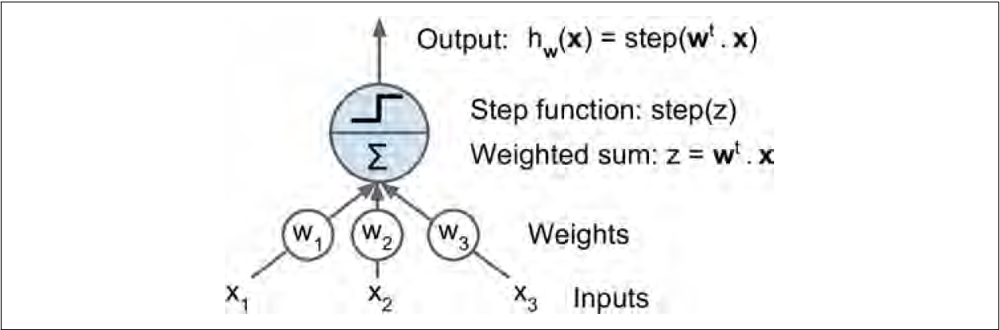

In [85]:
img_url = 'images/figure10-4.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

The most common step function used in Perceptrons is the Heaviside step function.

A single LTU can be used for simple linear binary classification. It computes a linear
combination of the inputs and if the result exceeds a threshold, it outputs the positive
class or else outputs the negative class (just like a Logistic Regression classifier or a
linear SVM).

In [86]:
classifier = Perceptron(random_state = 0, class_weight = 'balanced')
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
perc = cm.trace()/cm.sum()
print('Accuracy on a test set: ', perc)

Accuracy on a train set:  0.6985172981878089
[[11  5  7]
 [ 7 56 16]
 [20 10 20]]
Accuracy on a test set:  0.5723684210526315


## Stochastic Gradient Descent 

We have already mentioned how this works. We will apply this model to our train set. 

In [87]:
classifier = linear_model.SGDClassifier(max_iter=5, tol=None,random_state = 0, 
                                        alpha=0.0001, average=True,class_weight = 'balanced')
classifier.fit(X_train, Y_train)
print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
sgd = cm.trace()/cm.sum()
print('Accuracy on a test set: ', sgd)

Accuracy on a train set:  0.7116968698517299
[[10  5  8]
 [ 3 64 12]
 [17 12 21]]
Accuracy on a test set:  0.625


## XG Boost Classifier

XGBoost is a decision-tree-based ensemble Machine Learning algorithm that uses a gradient boosting framework. In prediction problems involving unstructured data (images, text, etc.) artificial neural networks tend to outperform all other algorithms or frameworks. However, when it comes to small-to-medium structured/tabular data, decision tree based algorithms are considered best-in-class right now. 

In [88]:
classifier = XGBClassifier(learning_rate =0.1, n_estimators=1000, max_depth=5, min_child_weight=1, gamma=0,
                           subsample=0.8, colsample_bytree=0.8, 
                           nthread=4, scale_pos_weight=1, seed=27)
classifier.fit(X_train, Y_train)
print(classifier.score(X_train, Y_train))

#how about on a test set
Y_pred = classifier.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
xgboost = cm.trace()/cm.sum()
xgboost

1.0
[[ 9  3 11]
 [ 1 61 17]
 [ 4 10 36]]


0.6973684210526315

## Which is the best model?

In [89]:
table = pd.DataFrame({
    'Model': ['Support Vector Machines', 'KNN', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 'Perceptron', 'Stochastic Gradient Decent', 
              'Decision Tree', 'Adaptive Boosting Classifier','XG Boost Classifier'],
    'Score': [svm, knn, log_regr, 
              rf, gnb, perc, sgd, 
              d_tree, adaboost, xgboost]})
table_df = table.sort_values(by='Score', ascending=False)
table_df = table_df.set_index('Model')
table_df

,Score
Model,
Adaptive Boosting Classifier,0.710526
XG Boost Classifier,0.697368
Random Forest,0.631579
Stochastic Gradient Decent,0.625000
Logistic Regression,0.598684
Decision Tree,0.585526
Perceptron,0.572368
Support Vector Machines,0.565789
KNN,0.506579


# Models with Grid search

One way to do that would be to fiddle with the hyperparameters manually, until you
find a great combination of hyperparameter values. This would be very tedious work,
and you may not have time to explore many combinations.
Instead you should get Scikit-Learn’s GridSearchCV to search for you. All you need to
do is tell it which hyperparameters you want it to experiment with, and what values to
try out, and it will evaluate all the possible combinations of hyperparameter values,
using cross-validation.

In [90]:
## We willl use this function to see what parameters gives a best score
def best_score(classifier):
    
    print('Accuracy on a train set: ', classifier.best_score_)    
    print('Best parameters: ', classifier.best_params_)
    print('Best Estimator:',classifier.best_estimator_)
    
    return classifier.best_score_

#### Ada Boost

In [91]:
param_grid = {'n_estimators': [30, 50, 100], 'learning_rate': [0.08, 0.1, 1, 5, 10]}
ada_grid = GridSearchCV(AdaBoostClassifier(algorithm = 'SAMME'), param_grid, cv=10, refit=True, verbose=1)
ada_grid.fit(X_train,Y_train)
score_ada_grid = best_score(ada_grid)

y_pred_grid = ada_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
ada_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', ada_grid_accuracy)

Fitting 10 folds for each of 15 candidates, totalling 150 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Accuracy on a train set:  0.6738056013179572
Best parameters:  {'learning_rate': 0.1, 'n_estimators': 50}
Best Estimator: AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.1,
                   n_estimators=50, random_state=None)
[[ 8  6  9]
 [ 1 73  5]
 [ 1 22 27]]
Gridsearch accuracy on a test set is:  0.7105263157894737


[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:   21.1s finished


#### Decision Tree 

In [92]:
decs_tree = DecisionTreeClassifier(random_state = 0)
#param_grid = {'min_samples_split': [4,7,10,12], criterion : ['entropy','gini']}
param_grid = {'min_samples_split' : range(10,500,20),'max_depth': range(1,20,2)}
decs_tree_grid = GridSearchCV(decs_tree, param_grid, cv=10, refit=True, verbose=1)
decs_tree_grid.fit(X_train, Y_train)
#print(decs_tree_grid.score(X_train_sc, Y_train))
score_decs_tree_grid= best_score(decs_tree_grid)

y_pred_grid = decs_tree_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
decs_tree_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', decs_tree_grid_accuracy)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 250 candidates, totalling 2500 fits
Accuracy on a train set:  0.6754530477759473
Best parameters:  {'max_depth': 3, 'min_samples_split': 70}
Best Estimator: DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=70,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=0, splitter='best')
[[ 8  4 11]
 [ 1 64 14]
 [ 2 13 35]]
Gridsearch accuracy on a test set is:  0.7039473684210527


[Parallel(n_jobs=1)]: Done 2500 out of 2500 | elapsed:    9.8s finished


#### KNN

In [93]:
knn = KNeighborsClassifier()
param_grid = {'leaf_size':list(range(3,15,1)), 'n_neighbors':list(range(1, 15, 1)), 
              'weights':['uniform', 'distance']}


knn_grid = GridSearchCV(knn, param_grid, cv=10, verbose=1, scoring='accuracy')
knn_grid.fit(X_train, Y_train)

score_knn_grid = best_score(knn_grid)


y_pred_grid = knn_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
knn_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', knn_grid_accuracy)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 336 candidates, totalling 3360 fits
Accuracy on a train set:  0.5700164744645799
Best parameters:  {'leaf_size': 3, 'n_neighbors': 10, 'weights': 'uniform'}
Best Estimator: KNeighborsClassifier(algorithm='auto', leaf_size=3, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')
[[ 1 14  8]
 [ 5 60 14]
 [ 3 30 17]]
Gridsearch accuracy on a test set is:  0.5131578947368421


[Parallel(n_jobs=1)]: Done 3360 out of 3360 | elapsed:   40.5s finished


#### Light Gradient Boosting 

In [94]:
param_grid = {"max_depth": [2,5,10], "learning_rate" : [0.05,0.1,0.2], 
              "num_leaves": [5,10,20,50], "n_estimators": [20,50,80]}
lgbm_grid = GridSearchCV(lgb.LGBMClassifier(silent=False), param_grid, cv=10)
lgbm_grid.fit(X_train,Y_train)
score_lgbm_grid = best_score(lgbm_grid)


y_pred_grid = lgbm_grid.predict(X_test)

cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
lgbm_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy is: ', lgbm_grid_accuracy)

Accuracy on a train set:  0.6803953871499177
Best parameters:  {'learning_rate': 0.2, 'max_depth': 10, 'n_estimators': 80, 'num_leaves': 10}
Best Estimator: LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.2, max_depth=10,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=80, n_jobs=-1, num_leaves=10, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=False,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
[[ 6  5 12]
 [ 1 63 15]
 [ 4 11 35]]
Gridsearch accuracy is:  0.6842105263157895


#### Linear SVM

In [95]:
param_grid = {'C': [0.1,10, 100, 1000,5000]}
lsvm_grid = GridSearchCV(LinearSVC(max_iter = 10000), param_grid, cv=10, refit=True, verbose=1)
lsvm_grid.fit(X_train,Y_train)
score_lsvm_grid= best_score(lsvm_grid)
y_pred_grid = lsvm_grid.predict(X_test)


cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
lsvm_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', lsvm_grid_accuracy)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:  1.3min finished


Accuracy on a train set:  0.6540362438220758
Best parameters:  {'C': 10}
Best Estimator: LinearSVC(C=10, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=10000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)
[[ 7  6 10]
 [ 1 63 15]
 [ 9 13 28]]
Gridsearch accuracy on a test set is:  0.6447368421052632


#### Logistic Regression

In [96]:
param_grid = {'C': np.logspace(0, 4, 1),   'penalty' : [ 'l2']
              , 'multi_class':['multinomial','auto','ovr'] }
log_reg = LogisticRegression(random_state = 42,class_weight='balanced',solver ='lbfgs', max_iter = 10000)


log_reg_grid = GridSearchCV(log_reg, param_grid, cv=10,refit =True)
log_reg_grid.fit(X_train,Y_train)
score_log_reg_grid = best_score(log_reg_grid)

y_pred_grid = log_reg_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
log_reg_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', log_reg_grid_accuracy)

Accuracy on a train set:  0.6227347611202636
Best parameters:  {'C': 1.0, 'multi_class': 'multinomial', 'penalty': 'l2'}
Best Estimator: LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=10000, multi_class='multinomial', n_jobs=None,
                   penalty='l2', random_state=42, solver='lbfgs', tol=0.0001,
                   verbose=0, warm_start=False)
[[11  4  8]
 [ 2 57 20]
 [19  9 22]]
Gridsearch accuracy on a test set is:  0.5921052631578947


#### Random Forest

In [97]:
param_grid = {'max_depth': [6,  8,12], 'max_features': [10,15,30],  
              'min_samples_split': [5, 7, 8,15],'n_estimators':[20,40,80]}


rf_grid = GridSearchCV(RandomForestClassifier(criterion = 'entropy',class_weight='balanced',bootstrap=True), param_grid, cv=10, refit=True, verbose=1)
rf_grid.fit(X_train,Y_train)
score_rf_grid = best_score(rf_grid)

y_pred_grid = rf_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
rf_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', rf_grid_accuracy)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Accuracy on a train set:  0.6787479406919276
Best parameters:  {'max_depth': 8, 'max_features': 15, 'min_samples_split': 7, 'n_estimators': 80}
Best Estimator: RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='entropy', max_depth=8, max_features=15,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=7, min_weight_fraction_leaf=0.0,
                       n_estimators=80, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)
[[ 9  4 10]
 [ 1 63 15]
 [ 7  9 34]]
Gridsearch accuracy on a test set is:  0.6973684210526315


[Parallel(n_jobs=1)]: Done 1080 out of 1080 | elapsed:  2.1min finished


#### SGD 

In [98]:
param_grid = {
    'loss': ['log'],
    'penalty': ['elasticnet'],
    'alpha': [10 ** x for x in range(-5, 1)],
    'l1_ratio': [0, 0.05, 0.1,  0.5, 0.8, 0.9,  1],
}
sgd = linear_model.SGDClassifier(random_state=0, class_weight='balanced')

sgd_grid = GridSearchCV(sgd, param_grid=param_grid, cv =10, n_jobs=1 )
sgd_grid.fit(X_train, Y_train)
score_sgd_grid = best_score(sgd_grid)

y_pred_grid = sgd_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
sgd_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', sgd_grid_accuracy)

Accuracy on a train set:  0.7034596375617792
Best parameters:  {'alpha': 0.1, 'l1_ratio': 0.5, 'loss': 'log', 'penalty': 'elasticnet'}
Best Estimator: SGDClassifier(alpha=0.1, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.5, learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=None, penalty='elasticnet',
              power_t=0.5, random_state=0, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
[[ 8  4 11]
 [ 2 67 10]
 [ 2 10 38]]
Gridsearch accuracy on a test set is:  0.743421052631579


#### Support Vector Machines

In [99]:
param_grid = {'C': [0.1,10, 100, 1000,5000]}
svm_grid = GridSearchCV(SVC(max_iter = 10000), param_grid, cv=10, refit=True, verbose=1)
svm_grid.fit(X_train,Y_train)
score_lsvm_grid= best_score(svm_grid)
y_pred_grid = svm_grid.predict(X_test)


cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
svm_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', svm_grid_accuracy)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Accuracy on a train set:  0.6013179571663921
Best parameters:  {'C': 10}
Best Estimator: SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=10000, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)
[[ 9  4 10]
 [ 4 57 18]
 [ 8 13 29]]
Gridsearch accuracy on a test set is:  0.625


[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    2.3s finished


#### XGB Classifier

In [100]:
xgb = XGBClassifier(learning_rate = 0.1,min_child_weight=1, 
                           subsample=0.8, colsample_bytree=0.8, objective= 'binary:logistic',
                           nthread=4, b_pos_weight=1, seed=27)
#gbc = GradientBoostingClassifier()
param_grid = {'n_estimators': [50, 100,200], 
              'min_samples_split': [3, 5, 7],
              'max_depth': [3, 5, 6]}

xgb_grid = GridSearchCV(xgb, param_grid, cv=10, refit=True, verbose=1)
xgb_grid.fit(X_train, Y_train)
score_xgb_grid = best_score(xgb_grid)


y_pred_grid = xgb_grid.predict(X_test)
cm_grid = confusion_matrix(Y_test, y_pred_grid)
print(cm_grid)
xgb_grid_accuracy = cm_grid.trace()/cm_grid.sum()
print('Gridsearch accuracy on a test set is: ', xgb_grid_accuracy)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 10 folds for each of 27 candidates, totalling 270 fits


[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:  2.2min finished


Accuracy on a train set:  0.6836902800658978
Best parameters:  {'max_depth': 3, 'min_samples_split': 3, 'n_estimators': 200}
Best Estimator: XGBClassifier(b_pos_weight=1, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, min_samples_split=3, missing=None,
              n_estimators=200, n_jobs=1, nthread=4, objective='multi:softprob',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=27, silent=None, subsample=0.8, verbosity=1)
[[ 8  3 12]
 [ 1 64 14]
 [ 4 12 34]]
Gridsearch accuracy on a test set is:  0.6973684210526315


## Which one is the best model with GridSearch?

In [101]:
table2 = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Linear Support Vector Machines', 'KNN', 'Logistic Regression', 
              'Random Forest',  'Stochastic Gradient Decent', 'Decision Tree', 
              'Adaptive Boosting Classifier','XG Boost Classifier','Light GBM'],
    'Score': [svm_grid_accuracy,lsvm_grid_accuracy, knn_grid_accuracy, log_reg_grid_accuracy, 
              rf_grid_accuracy, sgd_grid_accuracy, decs_tree_grid_accuracy, 
              ada_grid_accuracy, xgb_grid_accuracy,lgbm_grid_accuracy]})
table_df2 = table2.sort_values(by='Score', ascending=False)
table_df2 = table_df2.set_index('Model')
table_df2
#type(table_df2)
#table_df2.shape
#table_df.shape

,Score
Model,
Stochastic Gradient Decent,0.743421
Adaptive Boosting Classifier,0.710526
Decision Tree,0.703947
Random Forest,0.697368
XG Boost Classifier,0.697368
Light GBM,0.684211
Linear Support Vector Machines,0.644737
Support Vector Machines,0.625000
Logistic Regression,0.592105


Let us combine these two table.

In [102]:
pd.concat([table_df, table_df2],axis =1, sort=False, keys = ['Score','Score with grid search']) # concat dataframes

,Score,Score with grid search
,Score,Score
Adaptive Boosting Classifier,0.710526,0.710526
XG Boost Classifier,0.697368,0.697368
Random Forest,0.631579,0.697368
Stochastic Gradient Decent,0.625000,0.743421
Logistic Regression,0.598684,0.592105
Decision Tree,0.585526,0.703947
Perceptron,0.572368,NaN
Support Vector Machines,0.565789,0.625000
KNN,0.506579,0.513158


## Stacking Approach to predict Decision

The Ensemble method we will discuss in here is called stacking (short for
stacked generalization). It is based on a simple idea: instead of using trivial functions
(such as hard voting) to aggregate the predictions of all predictors in an ensemble,
why don’t we train a model to perform this aggregation? The figure below shows such an
ensemble performing a regression task on a new instance. Each of the bottom three
predictors predicts a different value (3.1, 2.7, and 2.9), and then the final predictor
(called a blender, or a meta learner) takes these predictions as inputs and makes the
final prediction (3.0).

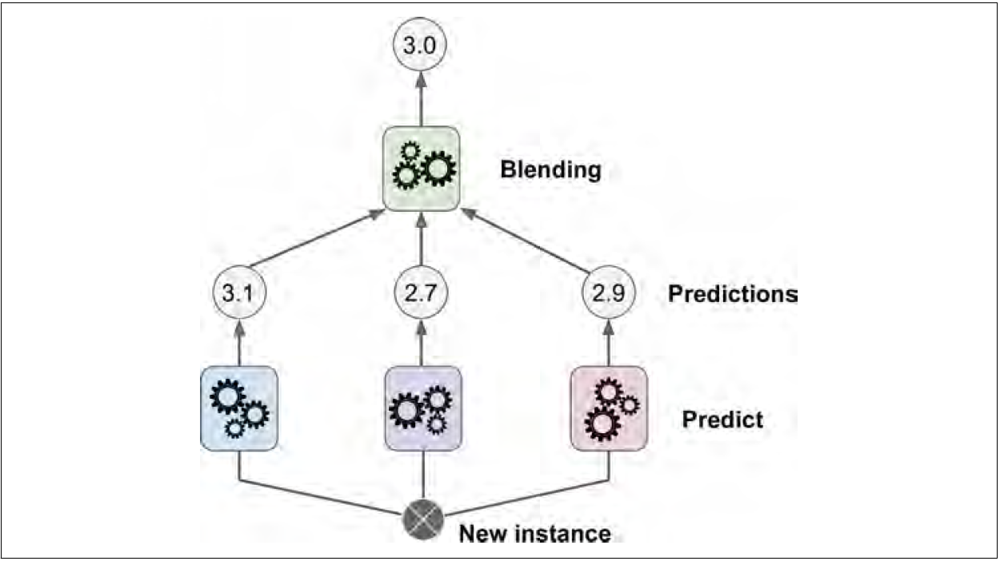

In [103]:
img_url = 'images/figure7-12.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

To train the blender, a common approach is to use a hold-out set. Let’s see how it
works. First, the training set is split in two subsets. The first subset is used to train the
predictors in the first layer in the figure below.

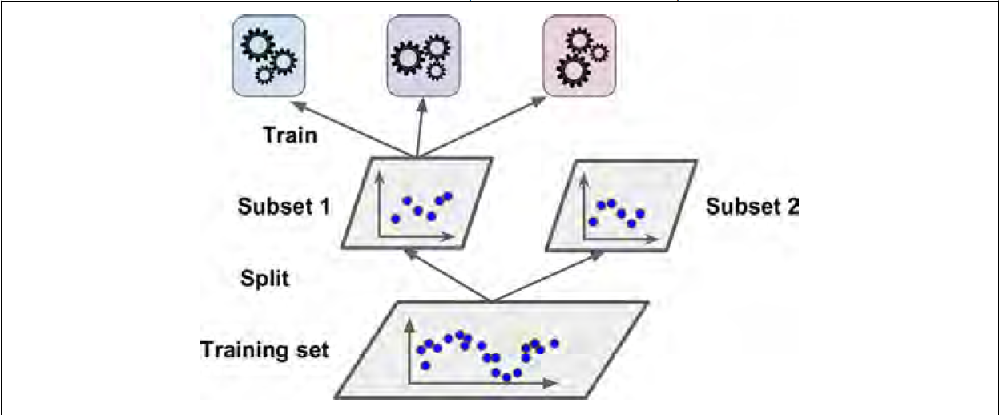

In [104]:
img_url = 'images/figure7-13.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

Next, the first layer predictors are used to make predictions on the second (held-out)
set (see the figure below). This ensures that the predictions are “clean,” since the predictors
never saw these instances during training. Now for each instance in the hold-out set
there are three predicted values. We can create a new training set using these predicted
values as input features (which makes this new training set three-dimensional),
and keeping the target values. The blender is trained on this new training set, so it
learns to predict the target value given the first layer’s predictions.

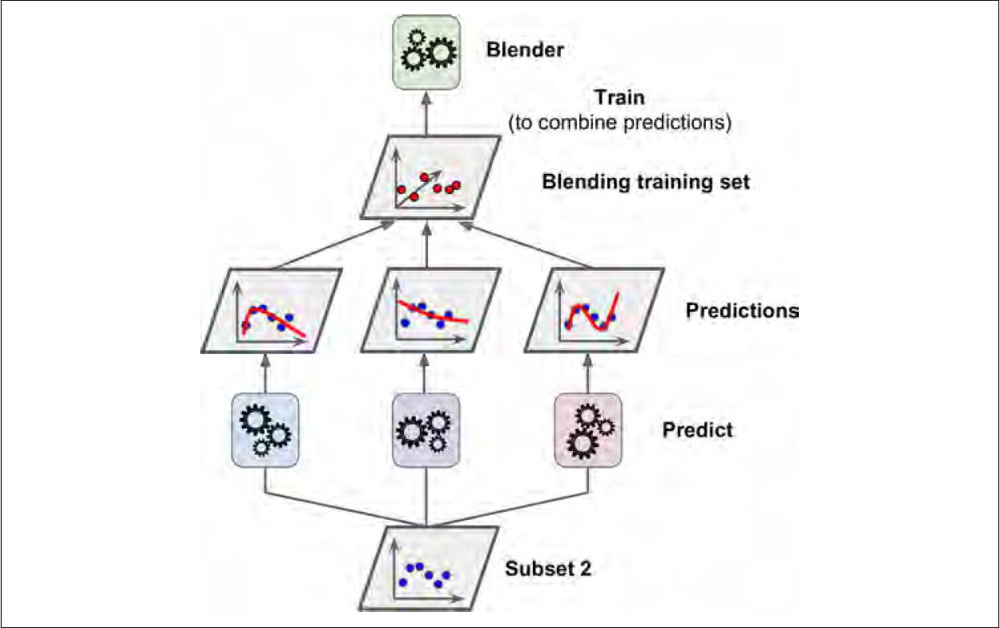

In [105]:
img_url = 'images/figure7-14.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

It is actually possible to train several different blenders this way (e.g., one using Linear
Regression, another using Random Forest Regression, and so on): we get a whole
layer of blenders. The trick is to split the training set into three subsets: the first one is
used to train the first layer, the second one is used to create the training set used to
train the second layer (using predictions made by the predictors of the first layer),
and the third one is used to create the training set to train the third layer (using predictions
made by the predictors of the second layer). Once this is done, we can make
a prediction for a new instance by going through each layer sequentially, as shown in

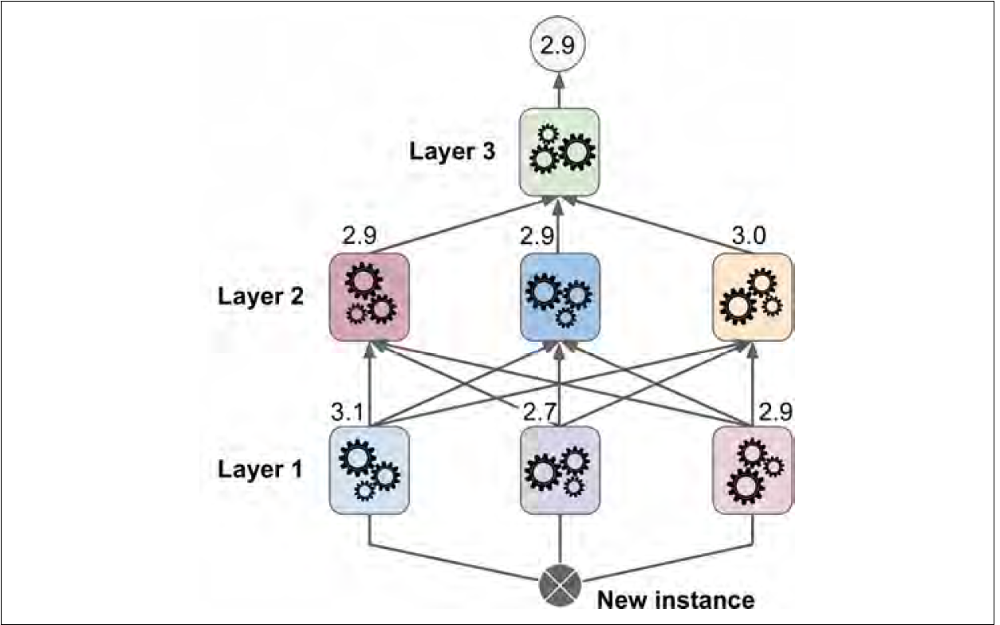

In [106]:
img_url = 'images/figure7-15.png'
# by default Image data are embedded
Embed      = Image(img_url)
Embed

We use a few models that gave best accuracy on a test set with grid search as our base model. We will aggregate these models to make new model, stacked model. Below, we train these models on a train set using cross validation technique.

In [107]:
# Set up models
#from lightgbm import *
from lightgbm import LGBMClassifier 
ada = AdaBoostClassifier(base_estimator = None, algorithm = 'SAMME',n_estimators=50, learning_rate=0.1,random_state = 42)
dtree = DecisionTreeClassifier(criterion = 'gini',random_state = 42, max_depth=3,min_samples_split =70)
#gnb = GaussianNB()
#knn = KNeighborsClassifier(leaf_size = 3, p=2,n_neighbors =10,weights ='uniform')
lightgb = LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.2, max_depth=10,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=80, n_jobs=-1, num_leaves=10, objective=None,
               random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=False,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
#lsvm = LinearSVC(C=10, class_weight=None, dual=True, fit_intercept=True,
          #intercept_scaling=1, loss='squared_hinge', max_iter=10000,
          #multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          #verbose=0)
#cls5 = LinearSVC(max_iter = 10000, class_weight = 'balanced', random_state = 0)
#logreg = LogisticRegression(C=0.65,random_state = 0, solver='lbfgs', 
                           #     multi_class='multinomial',class_weight='balanced', max_iter = 10000)
rf = RandomForestClassifier(bootstrap=True, class_weight='balanced',
                       criterion='entropy', max_depth=6, max_features=15,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=8, min_weight_fraction_leaf=0.0,
                       n_estimators=40, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)
#cls8 = Perceptron(random_state = 0, class_weight = 'balanced')
sgd = SGDClassifier(alpha=0.1, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.5, learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=None, penalty='elasticnet',
              power_t=0.5, random_state=0, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
#svm = SVC(max_iter = 10000, random_state = 0, gamma = 'auto',probability=True)
xgb = XGBClassifier(b_pos_weight=1, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.8,
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, min_samples_split=3, missing=None,
              n_estimators=200, n_jobs=1, nthread=4, objective='multi:softprob',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=27, silent=None, subsample=0.8, verbosity=1)

# Ada will be used for stacking
sclf = StackingCVClassifier(classifiers=[ada, dtree, lightgb, rf,sgd,xgb], 
                            meta_classifier=xgb, use_probas=True,cv =5)



# Do CV
for clf, label in zip([ada, dtree, lightgb, rf,sgd,xgb, sclf], 
                      ['ADA Boost','Decision tree','Light GBM',
                       'Random Forest','SGD','XGB',
                       'StackingClassifier']):

    scores = model_selection.cross_val_score(clf, X_train, Y_train, cv=5)
    print("Average accuracy on a train set: %0.4f (+/- %0.3f) [%s]" % (scores.mean(), scores.std(), label))


Average accuracy on a train set: 0.6755 (+/- 0.017) [ADA Boost]
Average accuracy on a train set: 0.6888 (+/- 0.027) [Decision tree]
Average accuracy on a train set: 0.6491 (+/- 0.027) [Light GBM]
Average accuracy on a train set: 0.6639 (+/- 0.028) [Random Forest]
Average accuracy on a train set: 0.7052 (+/- 0.025) [SGD]
Average accuracy on a train set: 0.6737 (+/- 0.045) [XGB]
Average accuracy on a train set: 0.6474 (+/- 0.034) [StackingClassifier]


Now, we will apply these models on a whole train set. We will generate new data frame that is the prediction of each model and get common values of this predictions to find one single prediction column of decision variable. 

In [108]:
def accuracy(Y_train, Y_pred):
    cm = confusion_matrix(Y_train, Y_pred)
    return cm.trace()/cm.sum()


#print('Accuracy on a train set: ',classifier.score(X_train, Y_train))

#how about on a test set
#Y_pred = classifier.predict(X_test)
#cm = confusion_matrix(Y_test, Y_pred)
#print(cm)
#log_regr= cm.trace()/cm.sum()
#print('Accuracy on a test set: ', log_regr)

X = X_train
y = Y_train

stack_gen_model = sclf.fit(np.array(X), np.array(y))
ada_model_full_data = ada.fit(X, y)
dtree_model_full_data = dtree.fit(X, y)
lightgb_model_full_data = lightgb.fit(X, y)
#knn_model_full_data = knn.fit(X, y)
#logreg_model_full_data = logreg.fit(X, y)
rf_model_full_data = rf.fit(X, y)
sgd_model_full_data = sgd.fit(X,y)
#svm_model_full_data = svm.fit(X, y)
xgb_model_full_data = xgb.fit(X, y)

# Get different data frames for each model
ada = pd.DataFrame(ada_model_full_data.predict(X),columns = ['ada'])
dtree = pd.DataFrame(dtree_model_full_data.predict(X),columns = ['dtree'])
lightgb = pd.DataFrame(lightgb_model_full_data.predict(X),columns = ['gnb'])
#knn = pd.DataFrame(knn_model_full_data.predict(X),columns = ['knn'])
#logreg = pd.DataFrame(logreg_model_full_data.predict(X),columns = ['logreg'])
rf = pd.DataFrame(rf_model_full_data.predict(X),columns = ['rf'])
sgd = pd.DataFrame(sgd_model_full_data.predict(X),columns = ['sgd'])
#svm = pd.DataFrame(svm_model_full_data.predict(X),columns = ['svm'])
xgb = pd.DataFrame(xgb_model_full_data.predict(X),columns = ['xgb'])
stack = pd.DataFrame(stack_gen_model.predict(X),columns = ['stack'])

# add new column for each this data sets
ada.insert(0, 'New_ID', range(1, 1 + len(ada)))
dtree.insert(0, 'New_ID', range(1, 1 + len(dtree)))
lightgb.insert(0, 'New_ID', range(1, 1 + len(lightgb)))
#knn.insert(0, 'New_ID', range(1, 1 + len(knn)))
#logreg.insert(0, 'New_ID', range(1, 1 + len(logreg)))
rf.insert(0, 'New_ID', range(1, 1 + len(rf)))
sgd.insert(0, 'New_ID', range(1, 1 + len(sgd)))
#svm.insert(0, 'New_ID', range(1, 1 + len(svm)))
xgb.insert(0, 'New_ID', range(1, 1 + len(xgb)))
stack.insert(0, 'New_ID', range(1, 1 + len(stack)))

# Make a new data frames using this columns
new_df = ada.merge(dtree, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
new_df = new_df.merge(lightgb, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
new_df = new_df.merge(rf, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(knn, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(logreg, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(sgd, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(svm, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(xgb, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(stack, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
#new_df.head()
# drop the first column
new_df = new_df.drop(columns="New_ID")
Y_pred = new_df.mode(axis=1)[0]
# get the common values in each column
#new_df.mode(axis=1)[0]
print("Average accuracy on a train set: %0.4f ",accuracy(Y_train, Y_pred))

Average accuracy on a train set: %0.4f  0.8401976935749588


We will apply this approach to test set. 

In [109]:
X =  X_test
ada = pd.DataFrame(ada_model_full_data.predict(X),columns = ['ada'])
dtree = pd.DataFrame(dtree_model_full_data.predict(X),columns = ['dtree'])
lightgb = pd.DataFrame(lightgb_model_full_data.predict(X),columns = ['gnb'])
#knn = pd.DataFrame(knn_model_full_data.predict(X),columns = ['knn'])
#logreg = pd.DataFrame(logreg_model_full_data.predict(X),columns = ['logreg'])
rf = pd.DataFrame(rf_model_full_data.predict(X),columns = ['rf'])
sgd = pd.DataFrame(sgd_model_full_data.predict(X),columns = ['sgd'])
#svm = pd.DataFrame(svm_model_full_data.predict(X),columns = ['svm'])
xgb = pd.DataFrame(xgb_model_full_data.predict(X),columns = ['xgb'])
stack = pd.DataFrame(stack_gen_model.predict(X),columns = ['stack'])
ada.insert(0, 'New_ID', range(1, 1 + len(ada)))
dtree.insert(0, 'New_ID', range(1, 1 + len(dtree)))
lightgb.insert(0, 'New_ID', range(1, 1 + len(lightgb)))
#knn.insert(0, 'New_ID', range(1, 1 + len(knn)))
#logreg.insert(0, 'New_ID', range(1, 1 + len(logreg)))
rf.insert(0, 'New_ID', range(1, 1 + len(rf)))
sgd.insert(0, 'New_ID', range(1, 1 + len(sgd)))
#svm.insert(0, 'New_ID', range(1, 1 + len(svm)))
xgb.insert(0, 'New_ID', range(1, 1 + len(xgb)))
stack.insert(0, 'New_ID', range(1, 1 + len(stack)))
new_df = ada.merge(dtree, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
new_df = lightgb.merge(dtree, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
new_df = new_df.merge(rf, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(knn, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(logreg, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(sgd, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
#new_df = new_df.merge(svm, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(xgb, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df = new_df.merge(stack, on = ['New_ID'], suffixes=(' ', ' '), how = 'outer')
new_df.columns = new_df.columns.str.strip()
new_df = new_df.drop(columns="New_ID")
Y_pred = new_df.mode(axis=1)[0]
stack_result = accuracy(Y_test, Y_pred)
print("Average accuracy on a test set: %0.4f ",accuracy(Y_test, Y_pred))

Average accuracy on a test set: %0.4f  0.7039473684210527


Last method we will be using to predict decision variable is h2o AutoML package.

## Using h2o AutoML package to predict Decision

H2O’s AutoML can be used for automating the machine learning workflow, which includes automatic training and tuning of many models within a user-specified time-limit. Stacked Ensembles – one based on all previously trained models, another one on the best model of each family – will be automatically trained on collections of individual models to produce highly predictive ensemble models which, in most cases, will be the top performing models in the AutoML Leaderboard.

The H2O AutoML interface is designed to have as few parameters as possible so that all the user needs to do is point to their dataset, identify the response column and optionally specify a time constraint or limit on the number of total models trained.



In [110]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,1 day 20 hours 39 mins
H2O cluster timezone:,America/Denver
H2O data parsing timezone:,UTC
H2O cluster version:,3.26.0.6
H2O cluster version age:,2 months and 1 day
H2O cluster name:,H2O_from_python_sergazy_gun35q
H2O cluster total nodes:,1
H2O cluster free memory:,2.000 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"locked, healthy"


We will be using the same data frame we have used above however, we need to convert pandas data frame into h2o data frame in order to use h2o packages.

In [111]:
type(df)
X_train_hf = h2o.H2OFrame(X_train)
#X_train.head()
Y_train_df =  Y_train.to_frame()
Y_train_hf = h2o.H2OFrame(Y_train_df)
#Y_train_hf.head()
X_test_hf = h2o.H2OFrame(X_test)
Y_test_df =  Y_test.to_frame()
Y_test_hf = h2o.H2OFrame(Y_test_df)
train = X_train_hf.cbind(Y_train_hf)
test = X_test_hf.cbind(Y_test_hf)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


In [112]:
y = "DECISION"
x = X_train_hf.columns

#train, test = df_hf.split_frame(ratios=[.8], seed=1)
# For binary classification, response should be a factor
#train[y] = train[y].asfactor()
#test[y] = test[y].asfactor()

In [113]:
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch

In [114]:
#h2o.estimators.xgboost.H2OXGBoostEstimator.available()

Now we will be applying h2o AutoML package to predict decision variable on train set. We will see the first 10 of models that gives the best prediction on a train set. Then we will pick the best model among this 10 to try on a test set. 

In [115]:
aml_first = H2OAutoML(max_models = 30, max_runtime_secs=300, seed = 1)
aml_first.train(x = x, y = y, training_frame = train)
lb = aml_first.leaderboard
lb.head()
lb.head(rows=10) # 10 leaderboard

AutoML progress: |████████████████████████████████████████████████████████| 100%


model_id,mean_per_class_error,logloss,rmse,mse
GBM_grid_1_AutoML_20191203_103927_model_2,0.407229,1.31798,0.530878,0.281831
XGBoost_grid_1_AutoML_20191203_103927_model_1,0.417118,0.725838,0.50669,0.256735
XGBoost_grid_1_AutoML_20191203_103927_model_4,0.418664,0.7241,0.503248,0.253259
XGBoost_grid_1_AutoML_20191203_103927_model_2,0.41918,0.707062,0.497744,0.247749
XGBoost_2_AutoML_20191203_103927,0.427726,0.726326,0.507059,0.257109
StackedEnsemble_BestOfFamily_AutoML_20191203_103927,0.432349,0.71419,0.496187,0.246201
XGBoost_grid_1_AutoML_20191203_103927_model_7,0.433316,0.74956,0.518527,0.26887
XGBoost_grid_1_AutoML_20191203_103927_model_3,0.433455,0.745136,0.512005,0.262149
XGBoost_1_AutoML_20191203_103927,0.436663,0.7117,0.496419,0.246431
GBM_1_AutoML_20191203_103927,0.436918,0.779571,0.504564,0.254585


This shows that GBM grid is the best one. Let us the performance of this model on a test set. We will see with what probabilities the model guess the different levels of the variable.

In [116]:
preds_first_train = aml_first.predict(test)
preds_first_train.describe()

gbm prediction progress: |████████████████████████████████████████████████| 100%
Rows:152
Cols:4




,predict,Admit,Reject,Waitlist
type,enum,real,real,real
mins,,5.209438295227014e-07,7.788663860572825e-05,4.030894069031509e-06
mean,,0.0894543802504499,0.5430801441875348,0.3674654755620154
maxs,,0.9989826928502821,0.9999940195863029,0.9998790114674498
sigma,,0.23210418898047652,0.4541262415953114,0.41652984678224486
zeros,,0,0,0
missing,0,0,0,0
0,Waitlist,0.05679192739664471,0.4480436880052786,0.4951643845980767
1,Waitlist,0.03619576290528703,0.06348535268099545,0.9003188844137174
2,Reject,0.007500718061633539,0.7485192076192061,0.2439800743191604


Overall perforamnce and confusion matrix will look like as below. Surpisingly, overall accuracy is 71 percentage which is slightly worse than SGD.

In [117]:
performance = aml_first.leader.model_performance(test)
performance.show()


ModelMetricsMultinomial: gbm
** Reported on test data. **

MSE: 0.27305611997075074
RMSE: 0.5225477202808857
LogLoss: 1.365883168606446
Mean Per-Class Error: 0.3831297009722987

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class


,Admit,Reject,Waitlist,Error,Rate
0,8.0,3.0,12.0,0.652174,15 / 23
1,2.0,65.0,12.0,0.177215,14 / 79
2,3.0,13.0,34.0,0.320000,16 / 50
3,13.0,81.0,58.0,0.296053,45 / 152



Top-3 Hit Ratios: 


,k,hit_ratio
0,1,0.703947
1,2,0.907895
2,3,1.000000


In [118]:
#aml_first.leader.predict_contributions(test)

In [119]:
s= performance.hit_ratio_table()[1][0]
#print(s)

## Conclusion about predicting the decision variable

The higher accuracy is the better. The accuracy table below shows that Stochastic Gradient Decent with grid search is the best model to predict the decision variable using the rating variable. 

In [120]:
table3 = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Linear Support Vector Machines', 'KNN', 'Logistic Regression', 
              'Random Forest',  'Stochastic Gradient Decent', 'Decision Tree', 
              'Adaptive Boosting Classifier','XG Boost Classifier','Light GBM','Stacking(Mixed) Model','h2o AutoML'],
    'Accuracy': [svm_grid_accuracy,lsvm_grid_accuracy, knn_grid_accuracy, log_reg_grid_accuracy, 
              rf_grid_accuracy, sgd_grid_accuracy, decs_tree_grid_accuracy, 
              ada_grid_accuracy, xgb_grid_accuracy,lgbm_grid_accuracy,stack_result,s]})
table_df3 = table3.sort_values(by='Accuracy', ascending=False)
table_df3 = table_df3.set_index('Model')
table_df3

,Accuracy
Model,
Stochastic Gradient Decent,0.743421
Adaptive Boosting Classifier,0.710526
h2o AutoML,0.703947
Decision Tree,0.703947
Stacking(Mixed) Model,0.703947
Random Forest,0.697368
XG Boost Classifier,0.697368
Light GBM,0.684211
Linear Support Vector Machines,0.644737


# Estimating the RATING variable.

## Individual Models

For the first part, we will estimate the rating variable with different models then we will use stacking approach. We will not be using decision variable to predict rating variable. Thus, we will drop decision variable. 

In [121]:
# y1_decision = students['DECISION']
# df = df.drop('DECISION', axis =1)
#df.info()
#df.head()
df = df.drop('DECISION', axis =1)
#df.info()
# let us divide this into train and test data
X_train, X_test, Y_train, Y_test = train_test_split(
     df.loc[:, df.columns != 'RATING'], 
     df['RATING'], test_size = 0.2, random_state=0)

In [122]:
kfolds = KFold(n_splits=10, shuffle=True, random_state=42)

def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X_train, y=Y_train):
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=kfolds))
    return (rmse)

Now, we will train all our models on a train set by tuning hyperparameters of algorithm.

In [123]:
alphas_ridge = [14.5, 14.6, 14.7, 14.8, 14.9, 15, 15.1, 15.2, 15.3, 15.4, 15.5]
alphas_lasso = [5e-05, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008, 0.01]
alphas_elastic = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007]
elastic_l1ratio = [0.8, 0.85, 0.9, 0.95, 0.99, 1]
alphas_krr = [0.6, 0.65,0.7, 0.75,0.7, 0.75,0.8, 0.85, 0.9, 0.95, 0.99, 1]



ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=alphas_ridge, cv=kfolds)) #This model may be very sensitive to outliers. 
lasso = make_pipeline(RobustScaler(), LassoCV(max_iter=1e7, alphas=alphas_lasso, random_state=42, cv=kfolds))
#ENet = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3))
elasticnet = make_pipeline(RobustScaler(), ElasticNetCV(max_iter=1e7, alphas=alphas_elastic, cv=kfolds, l1_ratio=elastic_l1ratio))                                
krr = KernelRidge(alpha=alphas_krr, kernel='polynomial', degree=2, coef0=2.5)
svr = make_pipeline(RobustScaler(), SVR(C= 20, epsilon= 0.008, gamma=0.0003,))

gbr = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05, max_depth=4, 
                                max_features='sqrt', min_samples_leaf=15, min_samples_split=10, 
                                loss='huber', random_state =42) 


lightgbm = LGBMRegressor(objective='regression', 
                                       num_leaves=4,
                                       learning_rate=0.01, 
                                       n_estimators=5000,
                                       max_bin=200, 
                                       bagging_fraction=0.75,
                                       bagging_freq=5, 
                                       bagging_seed=7,
                                       feature_fraction=0.2,
                                       feature_fraction_seed=7,
                                       verbose=-1,
                                       )


xgboost = XGBRegressor(learning_rate=0.01,n_estimators=3460,
                                     max_depth=3, min_child_weight=0.05,
                                     gamma=0.04, subsample=0.7,
                                     colsample_bytree=0.7,
                                     objective='reg:squarederror', nthread=-1,
                                     scale_pos_weight=1, random_state =42,
                                     reg_alpha=0.06, reg_lambda=0.8571)

tsr = TheilSenRegressor(random_state=42)
#rnsc = RANSACRegressor(random_state=42)
huber = HuberRegressor()
forest_reg = RandomForestRegressor(n_estimators=10, random_state=42)
lin_reg = LinearRegression()
tree_reg = DecisionTreeRegressor(criterion = 'mse',random_state = 0)
sgd_reg = linear_model.SGDRegressor(max_iter=1000, random_state = 42, eta0=0.000001, average=True)

Let us see the performance of each of these individual models on a train set. Since we have used 5-fold cross-validation, the first number in front of paranthesis is the mean of RMSE over the train set and the number inside of paranthesis is the standard deviation of the RMSE over the train set.

In [124]:
score = cv_rmse(ridge)
print("Ridge Regression RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
ridge_score= score.mean()

score = cv_rmse(lasso)
print("LASSO RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
lasso_score=score.mean()

score = cv_rmse(elasticnet)
print("Elasticnet RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
elasticnet_score=score.mean()

#score = cv_rmse(rnsc)
#print("RNSC: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
#ransac_score = score.mean()

score = cv_rmse(tsr)
print("TSR RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
theilsen_score = score.mean()

score = cv_rmse(huber)
print("Huber RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
huber_score = score.mean()

score = cv_rmse(krr)
print("Kernel Ridge Regression RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
krr_score = score.mean()

score = cv_rmse(svr)
print("SVR RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
svr_score = score.mean()

score = cv_rmse(lightgbm)
print("Light GBM RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
lightgm_score = score.mean()

score = cv_rmse(sgd_reg)
print("SGD RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
sgd_score = score.mean()

score = cv_rmse(lin_reg)
print("Linear Regression RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
lin_score =score.mean()

score = cv_rmse(tree_reg)
print("Decision Tree RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
tree_score =score.mean()

score = cv_rmse(forest_reg)
print("Random Forest RMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
forest = score.mean()

score = cv_rmse(gbr)
print("Gradient BoostingRMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
gbr_score =score.mean()

score = cv_rmse(xgboost)
print("XG boostRMSE score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()) )
xgb_score =score.mean()

Ridge Regression RMSE score: 0.8138 (0.0685)

LASSO RMSE score: 0.7934 (0.0695)

Elasticnet RMSE score: 0.8250 (0.0737)

TSR RMSE score: 0.8332 (0.0737)

Huber RMSE score: 0.8119 (0.0582)

Kernel Ridge Regression RMSE score: 1.0570 (0.0928)

SVR RMSE score: 0.8092 (0.0592)

Light GBM RMSE score: 0.8729 (0.0661)

SGD RMSE score: 0.8173 (0.0749)

Linear Regression RMSE score: 0.8311 (0.0756)

Decision Tree RMSE score: 1.1643 (0.1081)

Random Forest RMSE score: 0.8624 (0.0719)

Gradient BoostingRMSE score: 0.9243 (0.0659)

XG boostRMSE score: 0.8785 (0.0583)



Since we are predicting the RATING variable which is numeric, we will use RMSE distance to measure how well our model is doing. The lower is the better. We can put this into a data frame in order to compare them. 

In [125]:
table = pd.DataFrame({
    'Model': ['Ridge Regression', 'LASSO Regression', 'Elastic Net', 
              'Thielsen Regressor', 'Huber Regressor', 'Kernel Ridge Regression', 'Epsilon-Support Vector Regression', 
              'Light GBM', 'SGD','Linear Regression', 'Decision Tree Regressor',
             'Random Forest regressor', 'Gradient Boosting','XGBoost Regressor'],
    'Score': [ridge_score,lasso_score, elasticnet_score, 
              theilsen_score, huber_score, krr_score, svr_score, 
              lightgm_score, sgd_score, lin_score,tree_score,
             forest, gbr_score, xgb_score]})
table_df = table.sort_values(by='Score', ascending=True)
table_df = table_df.set_index('Model')
table_df

,Score
Model,
LASSO Regression,0.793411
Epsilon-Support Vector Regression,0.809163
Huber Regressor,0.811865
Ridge Regression,0.813751
SGD,0.817268
Elastic Net,0.825020
Linear Regression,0.831060
Thielsen Regressor,0.833203
Random Forest regressor,0.862422


##  Stacking approach (Blending)

Now, let us train all these models as well as stacking one on a whole train set.

In [126]:
# Stack all the models
stack_gen = StackingCVRegressor(regressors=(svr,huber, ridge, sgd_reg, lasso, elasticnet, lin_reg,
                                            tsr,forest_reg,lightgbm,xgboost),
                                meta_regressor=svr,
                                use_features_in_secondary=True)

#Train the model on a train set.
X = X_train
y = Y_train

stack_gen_model = stack_gen.fit(np.array(X), np.array(y))
svr_model_full_data = svr.fit(X, y)
huber_model_full_data = huber.fit(X, y)
ridge_model_full_data = ridge.fit(X, y)
sgd_model_full_data = sgd_reg.fit(X, y)
lasso_model_full_data = lasso.fit(X, y)
elastic_model_full_data = elasticnet.fit(X, y)
lin_model_full_data = lin_reg.fit(X,y)
tsr_model_full_data = tsr.fit(X, y)
rf_model_full_data = forest_reg.fit(X, y)
xgb_model_full_data = xgboost.fit(X, y)
lgb_model_full_data = lightgbm.fit(X, y)

Now it is time to mix all the models. All the numbers in front of models are chosen randomly. The higher number is given depending on their higher performance.

In [127]:
def mixed_models_predict(X):
    return (
            (0.01 * xgb_model_full_data.predict(X)) + \
            (0.01 * lgb_model_full_data.predict(X)) + \
            (0.05 * rf_model_full_data.predict(X)) + \
            (0.05 * tsr_model_full_data.predict(X)) + \
            (0.05 * lin_model_full_data.predict(X)) + \
            (0.05 * elastic_model_full_data.predict(X)) + \
            (0.15 * lasso_model_full_data.predict(X)) + \
            (0.05 * sgd_model_full_data.predict(X)) + \
            (0.1 * ridge_model_full_data.predict(X)) + \
            (0.1 * huber_model_full_data.predict(X)) + \
            (0.15 * svr_model_full_data.predict(X)) + \
            (0.29 * stack_gen_model.predict(np.array(X))))

Now we can try our mixed model both on a train set and test set.

In [128]:
print('RMSE score on a train data:')
print(rmse(y, mixed_models_predict(X)))

print('RMSE score on a test data:')
print(rmse(Y_test, mixed_models_predict(X_test)))

RMSE score on train data:
0.7914288623274237
RMSE score on test data:
0.8117989462368014


This shows RMSE score of the stacking approach on a test data is slighly worse than individual model. We will use h2o AutoML to predict the rating variable.

Now, we would like to use h2o AutoML package to predict rating and to compare the result with our stacking approach result.

## Using h2o  AutoML to predict the RATING

In [129]:
hf = h2o.H2OFrame(df)
#df.info()
y1 = "RATING"
# Identify predictors and response
x = hf.columns
x.remove(y1) #first I removed rating 
#y2 = "DECISION"
#x.remove(y2) #now I removed decision

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [130]:
train, test = hf.split_frame(ratios=[.8], seed=1)

We will see which model is doing better than others to predict rating variable. The table below shows first ten models.

In [131]:
aml_first = H2OAutoML(max_models = 30, max_runtime_secs=300, seed = 1)
aml_first.train(x = x, y = y1, training_frame = train)
lb = aml_first.leaderboard
lb.head()
lb.head(rows=10) # Entire leaderboard

AutoML progress: |████████████████████████████████████████████████████████| 100%


model_id,mean_residual_deviance,rmse,mse,mae,rmsle
GLM_grid_1_AutoML_20191203_104948_model_1,0.594093,0.770774,0.594093,0.616369,0.179042
GBM_grid_1_AutoML_20191203_104948_model_5,0.596092,0.77207,0.596092,0.617405,0.179331
GBM_grid_1_AutoML_20191203_104948_model_4,0.59661,0.772406,0.59661,0.617228,0.179354
GBM_grid_1_AutoML_20191203_104948_model_2,0.598395,0.77356,0.598395,0.617919,0.17965
GBM_grid_1_AutoML_20191203_104948_model_1,0.598524,0.773644,0.598524,0.619354,0.17958
StackedEnsemble_BestOfFamily_AutoML_20191203_104948,0.59914,0.774041,0.59914,0.617462,0.17973
StackedEnsemble_AllModels_AutoML_20191203_104948,0.601609,0.775634,0.601609,0.618597,0.180068
XGBoost_grid_1_AutoML_20191203_104948_model_6,0.608127,0.779825,0.608127,0.629748,0.179725
GBM_5_AutoML_20191203_104948,0.610199,0.781153,0.610199,0.625302,0.180999
XGBoost_grid_1_AutoML_20191203_104948_model_7,0.631104,0.794421,0.631104,0.644246,0.182827


Let us see the performance of the best model on a test set. We would like to compare RMSE score with our stacking approach. 

In [132]:
performance = aml_first.leader.model_performance(test)
performance.show()


ModelMetricsRegressionGLM: glm
** Reported on test data. **

MSE: 0.7061227120640939
RMSE: 0.8403110805315457
MAE: 0.6512500190822342
RMSLE: 0.20689927999737506
R^2: -0.05415778048534392
Mean Residual Deviance: 0.7061227120640939
Null degrees of freedom: 157
Residual degrees of freedom: 94
Null deviance: 110.6498733711292
Residual deviance: 111.56738850612685
AIC: 523.4059100243061


Surprisingly, our stacking approach gives better RMSE score comparing to h2o AutoML.

In [133]:
# preds_first = aml_first.predict(test)
# diff = (test['RATING']-preds_first)**2
# mse = diff.mean()
# print('MSE is:',mse)
# print('RMSE is:',np.sqrt(mse))

### Predicting RATING variable using other h2o models including Deep Learning

In [134]:
from h2o.grid.grid_search import H2OGridSearch
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
import os, time, sys
#import warnings
#warnings.filterwarnings("ignore")
#h2o.init()


In [137]:
test_original = test
# Split the train dataset
train, valid  = train.split_frame(ratios=[0.80], seed=42)

In [138]:
#h2o.shutdown()

In [139]:
#h2o.init()

### 1. Using h2o Gradient Boosting Machine (GBM) to predict the Rating

In [140]:
### 1. Gradient Boosting Machine (GBM)

# Prepare the hyperparameters
gbm_params = {
                'learn_rate': [0.01, 0.1], 
                'max_depth': [4, 5, 7],
                'sample_rate': [0.6, 0.8],               # Row sample rate
                'col_sample_rate': [0.2, 0.5, 0.9]       # Column sample rate per split (from 0.0 to 1.0)
                }



# Prepare the grid object
gbm_grid = H2OGridSearch(model=H2OGradientBoostingEstimator,   # Model to be trained
                          grid_id='gbm_grid1',                  # Grid Search ID
                          hyper_params=gbm_params,              # Dictionary of parameters
                          search_criteria={"strategy": "Cartesian"}   # RandomDiscrete
                          )

# Train the Model
start = time.time() 
gbm_grid.train(x=x,y=y1, 
                training_frame=train,
                validation_frame=valid,
                ntrees=100,      # Specify other GBM parameters not in grid
                score_tree_interval=5,     # For early stopping
                stopping_rounds=3,         # For early stopping
                stopping_tolerance=0.0005,
                seed=1)

end = time.time()
(end - start)/60

# Find the Model grid performance 
gbm_gridperf = gbm_grid.get_grid(sort_by='RMSE',decreasing = False)

# Identify the best model generated with least error
best_gbm_model = gbm_gridperf.models[0]

gbm Grid Build progress: |████████████████████████████████████████████████| 100%


The following tables shows 
1. Model summary (number of trees, number of leaves, max and min depth, min and max number of leaves)
2. MSE, RMSE MAE and RMSLE scores on a train data and validation data.
3. Scoring history (how the model gets lower RMSE depending on number of trees)
4. Variable importance (AGE, GPA, Major_3 and  R_AVG_WRITTEN has higher imporance comparing to other variables.)

In [141]:
best_gbm_model

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  gbm_grid1_model_32


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,85.0,85.0,25533.0,7.0,7.0,7.0,10.0,28.0,19.258823




ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.4614040389362596
RMSE: 0.6792672809257484
MAE: 0.5387202712109215
RMSLE: 0.16096459681476313
Mean Residual Deviance: 0.4614040389362596

ModelMetricsRegression: gbm
** Reported on validation data. **

MSE: 0.5323020587689251
RMSE: 0.7295903362633891
MAE: 0.5880943320986378
RMSLE: 0.1652839104268758
Mean Residual Deviance: 0.5323020587689251

Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2019-12-03 11:38:41,9.264 sec,0.0,0.779924,0.622010,0.608281,0.738063,0.598185,0.544737
1,,2019-12-03 11:38:41,9.290 sec,5.0,0.773312,0.616423,0.598012,0.737473,0.596020,0.543867
2,,2019-12-03 11:38:41,9.318 sec,10.0,0.767159,0.611273,0.588533,0.736305,0.594254,0.542145
3,,2019-12-03 11:38:41,9.346 sec,15.0,0.760299,0.605753,0.578054,0.735002,0.593028,0.540228
4,,2019-12-03 11:38:41,9.369 sec,20.0,0.752868,0.599767,0.566811,0.733505,0.591476,0.538030
5,,2019-12-03 11:38:41,9.387 sec,25.0,0.746640,0.594541,0.557471,0.733162,0.591362,0.537527
6,,2019-12-03 11:38:41,9.406 sec,30.0,0.740051,0.588614,0.547676,0.732461,0.590778,0.536499
7,,2019-12-03 11:38:41,9.434 sec,35.0,0.733718,0.583301,0.538342,0.731006,0.589139,0.534370
8,,2019-12-03 11:38:41,9.458 sec,40.0,0.728413,0.579169,0.530585,0.730719,0.589091,0.533950
9,,2019-12-03 11:38:41,9.478 sec,45.0,0.722364,0.573991,0.521809,0.730680,0.588364,0.533893



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,AGE,292.096222,1.000000,0.080257
1,GPA,287.561249,0.984474,0.079011
2,MAJOR_3,249.743011,0.855003,0.068620
3,R_AVG_WRITTEN,193.733551,0.663253,0.053230
4,GRE_SUB,176.181992,0.603164,0.048408
5,R_AVG_ORAL,163.581039,0.560024,0.044946
6,GRE_VERB,149.060486,0.510313,0.040956
7,R_AVG_ACADEMIC,142.610580,0.488232,0.039184
8,GRE_AW,140.161819,0.479848,0.038511
9,R_AVG_KNOWLEDGE,137.200775,0.469711,0.037697



See the whole table with table.as_data_frame()


In [142]:
#best_gbm_model.show()

### 2. Using h2o Random Forest Algorithm  to predict the Rating

In [143]:

# Prepare the hyperparameters
nfolds = 5
rf_params = {
                'max_depth': [3, 4,5],
                'sample_rate': [0.8, 1.0],               # Row sample rate
                'mtries' : [2,4,3]
                }



# Search criteria for parameter space
search_criteria = {'strategy': "RandomDiscrete",
                   "seed": 1,
                   'stopping_metric': "AUTO",
                   'stopping_tolerance': 0.0005
                   }



# Prepare the grid object
rf_grid = H2OGridSearch(model=H2ORandomForestEstimator,   # Model to be trained
                          grid_id='rf_grid',                  # Grid Search ID
                          hyper_params=rf_params,              # Dictionary of parameters
                          search_criteria=search_criteria,   # RandomDiscrete
                          )



# Train the Model
start = time.time() 
rf_grid.train(x=x,y=y1, 
                training_frame=train,
                validation_frame=valid,
                ntrees=100,      
                score_each_iteration=True,
                nfolds = nfolds,
                fold_assignment= "Modulo",
                seed=1
                )

end = time.time()
(end - start)/60



# Find the Model performance 
rf_gridperf = rf_grid.get_grid(sort_by='RMSE',decreasing = False)




# Identify the best model generated with least error
best_rf_model = rf_gridperf.models[0]

drf Grid Build progress: |████████████████████████████████████████████████| 100%


The following tables shows
1. Model summary (number of trees, number of leaves, max and min depth, min and max number of leaves)
2. MSE, RMSE MAE and RMSLE scores on a validation data and cross-validation data.
3. Cross-Validation Metrics Summary (MSE, RMSE MAE and RMSLE and their averages)
3. Scoring history (how the model gets lower RMSE depending on number of trees)
4. Variable importance (Age, MAJOR_3, GRE_AW and R_AVG_KNOWLEDGE  has higher imporance comparing to other variables.)

In [144]:
best_rf_model

Model Details
H2ORandomForestEstimator :  Distributed Random Forest
Model Key:  rf_grid_model_15


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,100.0,100.0,15466.0,3.0,3.0,2.97,1.0,8.0,7.66




ModelMetricsRegression: drf
** Reported on train data. **

MSE: NaN
RMSE: NaN
MAE: NaN
RMSLE: NaN
Mean Residual Deviance: NaN

ModelMetricsRegression: drf
** Reported on validation data. **

MSE: 0.5412043052700249
RMSE: 0.7356658924199387
MAE: 0.5920856392951237
RMSLE: 0.1666097910722875
Mean Residual Deviance: 0.5412043052700249

ModelMetricsRegression: drf
** Reported on cross-validation data. **

MSE: 0.602830179027225
RMSE: 0.7764213926903515
MAE: 0.6187751029867875
RMSLE: 0.18155186161042472
Mean Residual Deviance: 0.602830179027225

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.6187751,0.0768542,0.6450626,0.5497973,0.73412216,0.5490337,0.6158598
1,mean_residual_deviance,0.6028302,0.14902145,0.60454977,0.52050996,0.84908575,0.4580052,0.5820002
2,mse,0.6028302,0.14902145,0.60454977,0.52050996,0.84908575,0.4580052,0.5820002
3,r2,0.005669171,0.010130606,0.02097922,5.931315E-4,-0.006338461,0.00807203,0.0050399355
4,residual_deviance,0.6028302,0.14902145,0.60454977,0.52050996,0.84908575,0.4580052,0.5820002
5,rmse,0.7720201,0.09229819,0.777528,0.7214638,0.9214585,0.6767608,0.7628894
6,rmsle,0.17979087,0.028202832,0.17736925,0.16631396,0.22693303,0.1522602,0.17607793



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
0,,2019-12-03 11:39:13,29.434 sec,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,,2019-12-03 11:39:13,29.437 sec,1.0,NaN,NaN,NaN,0.729395,0.595822,0.532017
2,,2019-12-03 11:39:13,29.439 sec,2.0,NaN,NaN,NaN,0.724944,0.590629,0.525543
3,,2019-12-03 11:39:13,29.441 sec,3.0,NaN,NaN,NaN,0.727882,0.589844,0.529812
4,,2019-12-03 11:39:13,29.443 sec,4.0,NaN,NaN,NaN,0.728967,0.593993,0.531393
5,,2019-12-03 11:39:13,29.445 sec,5.0,NaN,NaN,NaN,0.732129,0.594280,0.536013
6,,2019-12-03 11:39:13,29.447 sec,6.0,NaN,NaN,NaN,0.736088,0.598430,0.541826
7,,2019-12-03 11:39:13,29.449 sec,7.0,NaN,NaN,NaN,0.736312,0.596148,0.542156
8,,2019-12-03 11:39:13,29.451 sec,8.0,NaN,NaN,NaN,0.735224,0.593783,0.540555
9,,2019-12-03 11:39:13,29.453 sec,9.0,NaN,NaN,NaN,0.736114,0.594355,0.541864



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,AGE,67.672417,1.000000,0.062841
1,MAJOR_3,63.343346,0.936029,0.058821
2,GRE_AW,62.170132,0.918692,0.057731
3,R_AVG_KNOWLEDGE,52.175598,0.771002,0.048450
4,R_AVG_ACADEMIC,49.758045,0.735278,0.046205
5,MAJOR_5,42.367226,0.626063,0.039342
6,R_AVG_EMOT,36.251003,0.535684,0.033663
7,TEST_READ,36.038612,0.532545,0.033466
8,TEST_WRITE,35.691498,0.527416,0.033143
9,TEST_SPEAK,32.808357,0.484811,0.030466



See the whole table with table.as_data_frame()


###  Using h2o  Deep Learning Algorithms to predict the Rating

In [145]:
l1_opt = [0, 0.00001,
          0.0001,
          0.001,
          0.01,
          0.1]

l2_opt = [0, 0.00001,
          0.0001,
          0.001,
          0.01,
          0.1]

activation_opt = ["RectifierWithDropout",
                  "TanhWithDropout"]

#Create the Hyperparameters
dl_params = {
             'activation': activation_opt,
             "input_dropout_ratio" : [0,0.05, 0.1],  # input layer dropout ratio to improve generalization. Suggested values are 0.1 or 0.2.
             'l1': l1_opt,
             'l2': l2_opt,
             'hidden_dropout_ratios':[[0.1,0.2,0.3], # hidden layer dropout ratio to improve generalization: one value per hidden layer.
                                      [0.1,0.5,0.5],
                                      [0.5,0.5,0.5]]
             }
search_criteria = {
                   'strategy': 'RandomDiscrete',
                   'max_runtime_secs': 1000,
                   'seed':1
                   }

#Prepare the grid object
dl_grid = H2OGridSearch(model=H2ODeepLearningEstimator(
                                                    epochs = 1000,   ## hopefully converges earlier...
                                                    adaptive_rate = True,  # http://cs231n.github.io/neural-networks-3/#sgd
                                                    stopping_metric="AUTO",
                                                    stopping_tolerance=1e-2,    ## stop when misclassification does not improve by >=1% for 2 scoring events
                                                    stopping_rounds=3,
                                                    hidden=[128,128,128],      ## more hidden layers -> more complex interactions
                                                    balance_classes= False,
                                                    standardize = True,  # If enabled, automatically standardize the data (mean 0, variance 1). If disabled, the user must provide properly scaled input data.
                                                    loss = "quantile"  # quantile for regression
                                                    ),
                        grid_id='dl_grid',
                        hyper_params=dl_params,
                        search_criteria=search_criteria)

#Train the Model
start = time.time() 
dl_grid.train(x=x,y=y1, 
                training_frame=train,
                validation_frame=valid,
                stopping_rounds=2,
                stopping_tolerance=0.0005,
                seed=1
                )

end = time.time()
(end - start)/60

deeplearning Grid Build progress: |███████████████████████████████████████| 100%


16.714356331030526

#### See the Model performance 

In [146]:
dl_gridperf = dl_grid.get_grid(sort_by='RMSE',decreasing = False)
dl_gridperf

                activation hidden_dropout_ratios input_dropout_ratio      l1  \
0     RectifierWithDropout       [0.1, 0.5, 0.5]                0.05   0.001   
1          TanhWithDropout       [0.1, 0.2, 0.3]                 0.0   0.001   
2          TanhWithDropout       [0.5, 0.5, 0.5]                0.05   0.001   
3          TanhWithDropout       [0.1, 0.2, 0.3]                 0.0   0.001   
4          TanhWithDropout       [0.1, 0.2, 0.3]                0.05     0.1   
5     RectifierWithDropout       [0.1, 0.5, 0.5]                 0.1     0.1   
6          TanhWithDropout       [0.5, 0.5, 0.5]                 0.0     0.1   
7     RectifierWithDropout       [0.1, 0.5, 0.5]                 0.1   0.001   
8     RectifierWithDropout       [0.1, 0.2, 0.3]                0.05   0.001   
9          TanhWithDropout       [0.5, 0.5, 0.5]                 0.0     0.0   
10         TanhWithDropout       [0.1, 0.5, 0.5]                 0.1     0.1   
11         TanhWithDropout       [0.1, 0

#### Identify the best model generated with least error

The following tables shows
1. Model summary (number of layers, number of units, activation function, dropout, metrics, bias and weights)
2. MSE, RMSE MAE and RMSLE scores on a train data and validation data.
3. Scoring history (how the model gets lower RMSE depending on number of trees)
4. Variable importance (It is hard to tell because all of the variables have almost same amount of percentages with a small difference.)

In [148]:
best_dl_model = dl_gridperf.models[0]
best_dl_model

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  dl_grid_model_3


Status of Neuron Layers: predicting RATING, regression, quantile distribution, Quantile loss, 41,345 weights/biases, 504.7 KB, 475,000 training samples, mini-batch size 1


,,layer,units,type,dropout,l1,l2,mean_rate,rate_rms,momentum,mean_weight,weight_rms,mean_bias,bias_rms
0,,1,63,Input,5,,,,,,,,,
1,,2,128,RectifierDropout,10,0.001,0,0.451522,0.129564,0,0.00017083,0.0926476,-0.174969,0.645087
2,,3,128,RectifierDropout,50,0.001,0,0.434724,0.12432,0,3.47801e-05,0.0468903,-0.00723855,0.0934175
3,,4,128,RectifierDropout,50,0.001,0,0.152296,0.0926554,0,-0.00304255,0.0332958,0.0490408,0.121873
4,,5,1,Linear,,0.001,0,0.0323358,0.0487501,0,-0.0336463,0.121722,0.458348,1.09713e-154




ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 0.32933992028547765
RMSE: 0.573881451421352
MAE: 0.42701955667175023
RMSLE: 0.14012111489372026
Mean Residual Deviance: 0.21350977833587512

ModelMetricsRegression: deeplearning
** Reported on validation data. **

MSE: 0.5320507992904316
RMSE: 0.7294181237743079
MAE: 0.59293519385762
RMSLE: 0.1642795236592628
Mean Residual Deviance: 0.29646759692881

Scoring History: 


,,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_deviance,training_mae,training_r2,validation_rmse,validation_deviance,validation_mae,validation_r2
0,,2019-12-03 11:40:04,0.000 sec,None,0.0,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,,2019-12-03 11:40:04,42.538 sec,9205 obs/sec,10.0,1,4750.0,0.763449,0.296639,0.593277,0.041800,0.739568,0.297285,0.594570,-0.004096
2,,2019-12-03 11:40:09,47.628 sec,12761 obs/sec,150.0,15,71250.0,0.576603,0.213132,0.426263,0.453426,0.854709,0.346338,0.692675,-0.341084
3,,2019-12-03 11:40:15,52.836 sec,15436 obs/sec,350.0,35,166250.0,0.481838,0.182735,0.365471,0.618321,0.828306,0.337424,0.674848,-0.259508
4,,2019-12-03 11:40:20,57.870 sec,16255 obs/sec,540.0,54,256500.0,0.573881,0.213510,0.427020,0.458573,0.729418,0.296468,0.592935,0.023275
5,,2019-12-03 11:40:25,1 min 3.018 sec,16590 obs/sec,730.0,73,346750.0,0.558292,0.204478,0.408957,0.487588,0.745630,0.310570,0.621140,-0.020625
6,,2019-12-03 11:40:30,1 min 8.264 sec,17094 obs/sec,940.0,94,446500.0,0.513069,0.189142,0.378284,0.567241,0.781305,0.319860,0.639719,-0.120624
7,,2019-12-03 11:40:33,1 min 11.022 sec,16461 obs/sec,1000.0,100,475000.0,0.544100,0.200353,0.400706,0.513310,0.750229,0.304951,0.609902,-0.033254
8,,2019-12-03 11:40:33,1 min 11.044 sec,16459 obs/sec,1000.0,100,475000.0,0.573881,0.213510,0.427020,0.458573,0.729418,0.296468,0.592935,0.023275



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,R_AVG_KNOWLEDGE,1.000000,1.000000,0.025921
1,Emphasis Area_4,0.987027,0.987027,0.025585
2,R_AVG_ACADEMIC,0.962293,0.962293,0.024944
3,Emphasis Area 2_2,0.934657,0.934657,0.024227
4,R_AVG_WRITTEN,0.915670,0.915670,0.023735
5,R_AVG_ORAL,0.874860,0.874860,0.022677
6,Emphasis Area_3,0.868058,0.868058,0.022501
7,R_AVG_RATING,0.833698,0.833698,0.021610
8,Emphasis Area 2_4,0.816010,0.816010,0.021152
9,R_AVG_EMOT,0.795749,0.795749,0.020627



See the whole table with table.as_data_frame()


#### Compare Model Performances

We will compare these three models (GBM, RF and Deep Learning) on a test set.

In [149]:
best_gbm_perf= best_gbm_model.model_performance(test)  # GBM Model
best_rf_perf = best_rf_model.model_performance(test)   # Random Forest Model
best_dl_perf = best_dl_model.model_performance(test)   #deep Learning Model

In [150]:
print(best_gbm_perf)
print(best_rf_perf)
print(best_dl_perf)


ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.7035010023505746
RMSE: 0.838749666080753
MAE: 0.6524428577331286
RMSLE: 0.2063354428619273
Mean Residual Deviance: 0.7035010023505746


ModelMetricsRegression: drf
** Reported on test data. **

MSE: 0.7023122333958572
RMSE: 0.8380407110611376
MAE: 0.6502078553770162
RMSLE: 0.20637562470639753
Mean Residual Deviance: 0.7023122333958572


ModelMetricsRegression: deeplearning
** Reported on test data. **

MSE: 0.8020512064440112
RMSE: 0.8955731161909737
MAE: 0.6872879250485764
RMSLE: 0.2177330540119891
Mean Residual Deviance: 0.3436439625242882



In [151]:
gbm_pred= best_gbm_model.predict(test_original).as_data_frame()
rf_pred = best_rf_model.predict(test_original).as_data_frame()
dl_pred = best_dl_model.predict(test_original).as_data_frame()

rating_original = test_original['RATING'].as_data_frame()
diff = (rating_original['RATING']-gbm_pred['predict'])**2
mse = diff.mean()
print('MSE of GBM on a test set is:',mse)
print('RMSE of GBM on a test set is:',np.sqrt(mse))

diff = (rating_original['RATING']-rf_pred['predict'])**2
mse = diff.mean()
print('MSE of RF on a test set is:',mse)
print('RMSE of RF on a test set :',np.sqrt(mse))

diff = (rating_original['RATING']-dl_pred['predict'])**2
mse = diff.mean()
print('MSE of DL on a test set is:',mse)
print('RMSE of DL on a test set is:',np.sqrt(mse))

gbm prediction progress: |████████████████████████████████████████████████| 100%
drf prediction progress: |████████████████████████████████████████████████| 100%
deeplearning prediction progress: |███████████████████████████████████████| 100%
MSE of GBM on a test set is: 0.7035010206909658
RMSE of GBM on a test set is: 0.8387496770139263
MSE of RF on a test set is: 0.7023122523084623
RMSE of RF on a test set : 0.83804072234496
MSE of DL on a test set is: 0.8020512235735351
RMSE of DL on a test set is: 0.895573125754416


In [ ]:
# hyper_parameters = {
#     'hidden' : [[20,20],[50,50,50],[200,200],[50,50,50,50,50]],
#     'activation' : ["tanh","rectifier"],
#     'learning_rate' : [lr/1e3 for lr in range(1,10)] 
# }

# parameters = {
#     'seed' : 42,
#     'epochs' : 500,
#     'nfolds' : 3,
#     'stopping_rounds' : 3,          ## enable early stopping of each model in the hyperparameter search
#     'stopping_metric' : "auto",
#     'stopping_tolerance' : 1e-3     ## stop once validation logloss of the cv models doesn't improve enough
# }

# search_criteria = {
#     'strategy': "RandomDiscrete",
#     'max_runtime_secs': 30,         ## limit the runtime to 30 seconds
#     'max_models': 100,              ## build no more than 100 models
#     'seed' : 42,
#     'stopping_rounds' : 5,          ## enable early stopping of the overall leaderboard
#     'stopping_metric' : "auto",
#     'stopping_tolerance': 1e-4
# }  
# print(hyper_parameters)

In [162]:
#pip install ~/h2o-3/h2o-py/dist/h2o-*.whl

ERROR: h2o-*.whl is not a valid wheel filename.
Note: you may need to restart the kernel to use updated packages.


In [163]:
# from __future__ import print_function
# import sys, os
# sys.path.insert(1, os.path.join("..","..",".."))
# #import h2o
# #from tests import pyunit_utils
# #from h2o.estimators.deepwater import H2ODeepWaterEstimator
# from h2o.estimators.deepwater import H2ODeepWaterEstimator

In [164]:
# #train = h2o.import_file(pyunit_utils.locate("bigdata/laptop/lending-club/LoanStats3a.csv"))
# #train = train[:39786,:] ## only the first 39786 records are correct, the rest is from a different dataset
# #response = 'loan_amnt'
# #predictors = list(set(train.names) - set([response, 'id','emp_title','title','desc','revol_util','zip_code'])) ## remove high-cardinality columns
# #print("Creating the model architecture from scratch using the MXNet Python API")
# #PATH = "/tmp/symbol-py.json"
# #net().save(PATH)

# #print("Importing the model architecture for training in H2O")
# model = H2ODeepWaterEstimator(epochs=20, nfolds=3)
# model.train(x=x, y=y1, training_frame=train)
# model.show()
# error = model.model_performance(xval=True).rmse()

deepwater Model Build progress: | (failed)


OSError: Job with key $03017f00000132d4ffffffff$_949f9dc1561a7eea52a4a68795554dd1 failed with an exception: java.lang.RuntimeException: Unable to initialize the native Deep Learning backend: No backend found. Cannot build a Deep Water model.
stacktrace: 
java.lang.RuntimeException: Unable to initialize the native Deep Learning backend: No backend found. Cannot build a Deep Water model.
	at hex.deepwater.DeepWaterModelInfo.setupNativeBackend(DeepWaterModelInfo.java:267)
	at hex.deepwater.DeepWaterModelInfo.<init>(DeepWaterModelInfo.java:214)
	at hex.deepwater.DeepWaterModel.<init>(DeepWaterModel.java:227)
	at hex.deepwater.DeepWater$DeepWaterDriver.buildModel(DeepWater.java:131)
	at hex.deepwater.DeepWater$DeepWaterDriver.computeImpl(DeepWater.java:118)
	at hex.ModelBuilder$Driver.compute2(ModelBuilder.java:222)
	at hex.deepwater.DeepWater$DeepWaterDriver.compute2(DeepWater.java:111)
	at water.H2O$H2OCountedCompleter.compute(H2O.java:1417)
	at jsr166y.CountedCompleter.exec(CountedCompleter.java:468)
	at jsr166y.ForkJoinTask.doExec(ForkJoinTask.java:263)
	at jsr166y.ForkJoinPool$WorkQueue.runTask(ForkJoinPool.java:974)
	at jsr166y.ForkJoinPool.runWorker(ForkJoinPool.java:1477)
	at jsr166y.ForkJoinWorkerThread.run(ForkJoinWorkerThread.java:104)


In [ ]:
# gs = H2OGridSearch(H2ODeepWaterEstimator,
#                    hyper_params=hyper_parameters,
#                    search_criteria=search_criteria)
# gs.train(x=x, y=y1, training_frame=train, **parameters)

In [ ]:
# gs.get_grid("logloss")

In [ ]:
# for model in model_grid:
#     print(model.model_id + " mse: " + str(model.mse()))

## Combine all the results for predicting the rating variable

| Name of the model          |   RMSE | 
| --------------------           |:--------------------:| 
| LASSO Regression| 0.793411|
|Epsilon-Support Vector Regression|	0.809163|
|Huber Regressor	| 0.811865|
|Ridge Regression	|0.813751|
|Stochastic Gradient Descent	|0.817268
| Stacking Approach(Blending)  | 0.817234  |
| H2O GBM             |  0.838101           |     
| H2O RF         | 0.838119           | 
| H2O AutoML                |  0.840311         |
| H2O DL               |  0.895573         |

     





## Conclusion

The structure of the data contains both categorical and numerical variable. Target variables are DECISION variable(categorical) and RATING variable(numerical). 

We started with two goals at the beginning of this jupyter notebook. The first one is to predict the decision variable that determines if the student is admitted, rejected or waitlisted. In this case, recall that we have used the rating variable to predict the decision variable. The second goal was to predict the rating variable. Our first problem is classification problem whereas the second one is regression problem.


The methods we have used includes Decision Tree, Logistic Regression Random Forest ,Stochastic Gradient Descent, k-nearest neighbor, Gaussian Naive Bayes, Perceptron, Support Vector Machine, Adaptive Boosting, XGBoost, Stacking(Blending) Ensemble and h2o functions such as AutoML, GBM, and Deep Learning. 

We have found that Stochastic Gradiend Descent with grid search is the best model to predict the decision variables. Surprisingly, it even gives better result thatn h2oAutoML function.

To predict the RATING variable, we have used very complicated models, mixed bunch of models in order to minimize the error. However, we have found that basic models such as Lasso regression and epsilon support vector regression gave lower RMSE score comparing to other complicated models including neural network. 


The number of predictor variables is quite large and it is not initially clear what the most significant predictor variables will be. The results of these analysis point to a common choice of the most relevant predictor variables:

- Applicant's age
- Applicant's GPA
- Applicant's choice of emphasis area for study in graduate school
- Applicant's GRE scores
- Applicant's undergraduate major
- Applicant's average ratings of knowledge given by applicant's recommenders


Even though one might expect that these variables should have high predictive ability it is not clear which should be most predictive. A surprising output of our analysis is that age is found to be highly predictive, at least for certain models. This was somewhat unexpected as most applicant’s tend to be of a similar age in their early twenties. There are some outliers in their early to late thirties and perhaps the presence of these applicants naturally splits the dataset, making the age variable an easy predictor to split upon and reduce the classification or regression error. Also of some interest is the fact that among the GRE scores the verbal one tends to have slightly more predictive ability than the quantitative one. This is not entirely unsurprising, as the quantitative scores among Math PhD students tend to be fairly homogeneous. There is greater variability within the verbal scores, and apparently there is some sort of positive correlation between verbal abilities and a high rating being given to the student application. Whether this is deliberate or not on the part of the reviewers is unknown.


In both cases, predicting the decision and predicting the rating variable, we see that some simpler models gave us better result comparing to more complicated models. One possible explanation of this could be the relationship between our variables and the response is linear. Another explanation would be the number of sample is not too many.

For the future work, one might try multiple imputation technique instead of basic method to fill the missing values. 

There can be extra variables that represent the number of publications, and where they are published and impact factor of journals. Since publications may boost students' chance to get admitted, adding these aforementioned variables might improve the accuracy of the model. 

Having distributions of the GPA's of the universities where students are coming from may lead to have better prediction of the decision about students. It would also be useful to have a quantative opinion of the strength of  each recommender. 


In [ ]:
#h2o.shutdown(prompt=False)

## References 

1. https://www.kaggle.com/dejavu23/titanic-survival-seaborn-and-ensembles
2. http://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html
3. https://www.kaggle.com/manuelc/best-model-mixed-classifier
4. https://towardsdatascience.com/advanced-ensemble-classifiers-8d7372e74e40
5. https://www.kaggle.com/rohitjain2086/house-price-prediction-using-ml-techniques-h2o-ai
6. https://victorzhou.com/blog/intro-to-neural-networks/
7. https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d
8. http://docs.h2o.ai/h2o/latest-stable/h2o-docs/index.html
9. Hands-On Machine Learning with Scikit-Learn and TensorFlow by Aurélien Géron